# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, **you can simply reuse your previous GAN code for the generator and critic class (You can just copy your previous implementation of DCGAN generator here)**. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

d:\anaconda\envs\MachineLearning\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        #### START CODE HERE ####
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True)
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh()
            )
        #### END CODE HERE ####
        
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        #### START CODE HERE ####
        noise = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(noise)
        #### END CODE HERE ####

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        #### START CODE HERE ####
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True)
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride)
            )
        #### END CODE HERE ####
        
    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        #### START CODE HERE ####
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)
        #### END CODE HERE ####

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
n_epochs = 100
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Failed to download (trying next):
HTTP Error 404: Not Found

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 9912422/9912422 [01:10<00:00, 140497.88it/s]



Extracting .\MNIST\raw\train-images-idx3-ubyte.gz to .\MNIST\raw

Failed to download (trying next):
HTTP Error 404: Not Found

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 28881/28881 [00:00<00:00, 78089.39it/s]



Extracting .\MNIST\raw\train-labels-idx1-ubyte.gz to .\MNIST\raw

Failed to download (trying next):
HTTP Error 404: Not Found

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 1648877/1648877 [00:34<00:00, 47956.04it/s]



Extracting .\MNIST\raw\t10k-images-idx3-ubyte.gz to .\MNIST\raw

Failed to download (trying next):
HTTP Error 404: Not Found

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 4542/4542 [00:00<00:00, 1511466.90it/s]

Extracting .\MNIST\raw\t10k-labels-idx1-ubyte.gz to .\MNIST\raw



Then, you can initialize your generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [6]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        outputs=mixed_scores,
        inputs=mixed_images,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [7]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [8]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1 and return the penalty
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - 1) ** 2)
    return penalty
    #### END CODE HERE ####

In [9]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [10]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    return -crit_fake_pred.mean()
    #### END CODE HERE ####

In [11]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [12]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    return (crit_fake_pred.mean() - crit_real_pred.mean()) + c_lambda * gp
    #### END CODE HERE ####

In [13]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

  6%|▋         | 30/469 [00:01<00:24, 17.86it/s]

Epoch 1, step 500: Generator loss: -0.6360270549398847, critic loss: -96.07687782402034


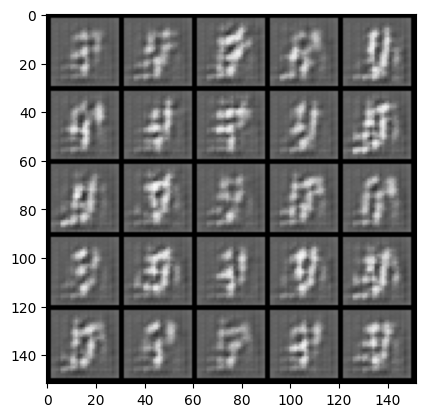

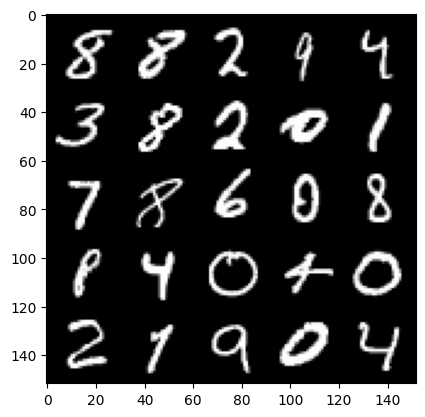

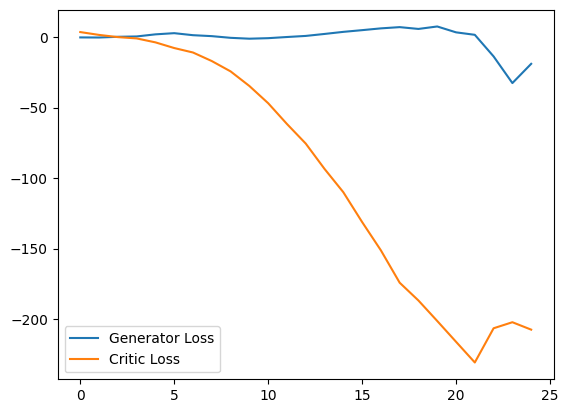

 13%|█▎        | 62/469 [00:03<00:22, 18.05it/s]

Epoch 2, step 1000: Generator loss: -27.085414031669497, critic loss: -113.91342136573803


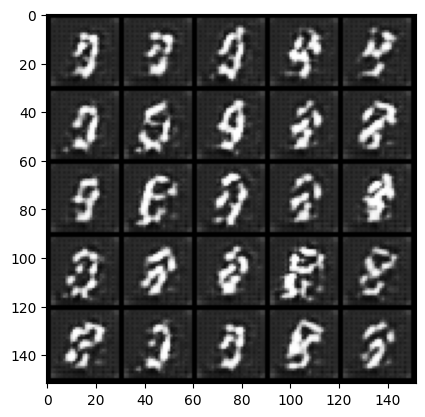

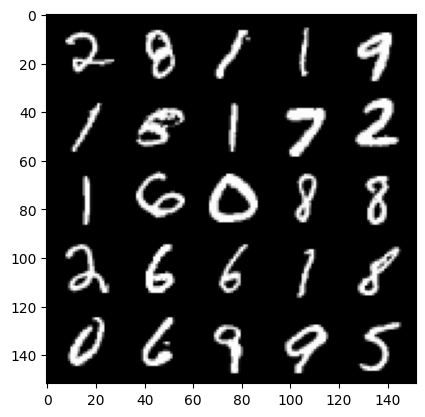

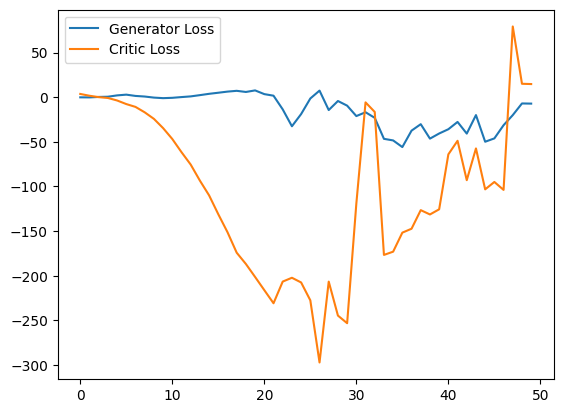

 20%|█▉        | 92/469 [00:05<00:20, 18.04it/s]

Epoch 3, step 1500: Generator loss: -14.76631531238556, critic loss: 9.52573492641449


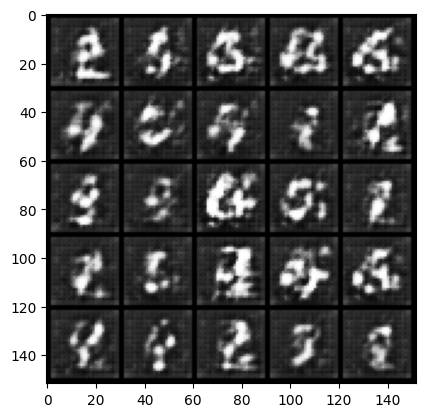

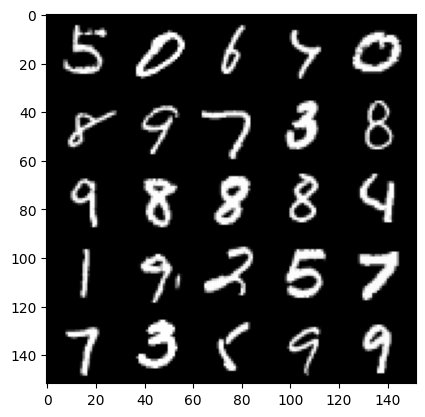

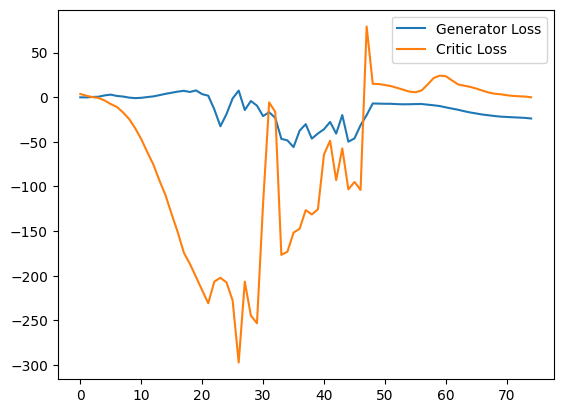

 26%|██▋       | 124/469 [00:06<00:19, 18.11it/s]

Epoch 4, step 2000: Generator loss: -24.07827410888672, critic loss: -5.840548336029054


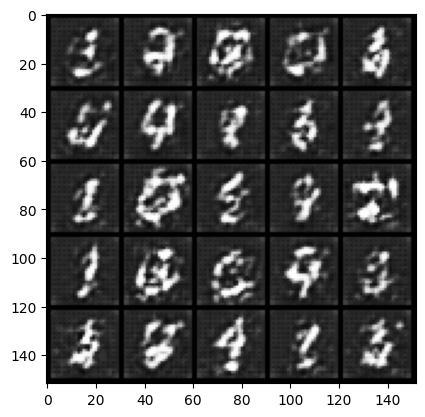

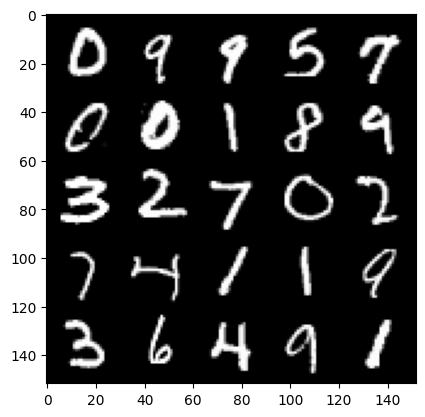

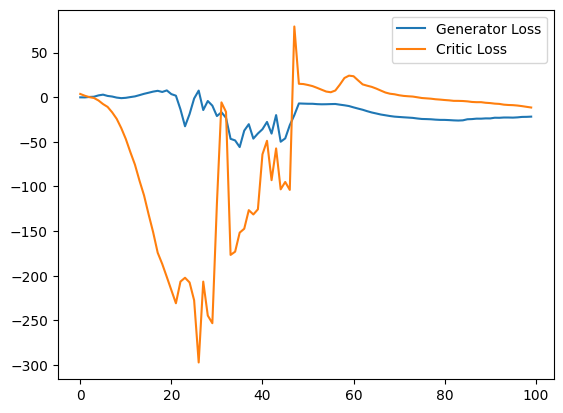

 33%|███▎      | 154/469 [00:08<00:17, 17.93it/s]

Epoch 5, step 2500: Generator loss: -11.652399578392506, critic loss: -20.341742210006725


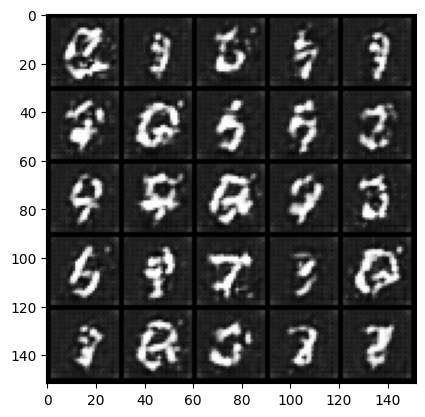

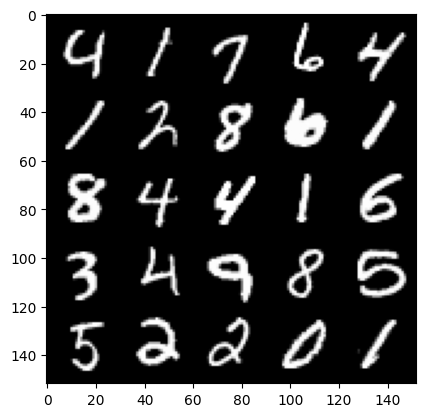

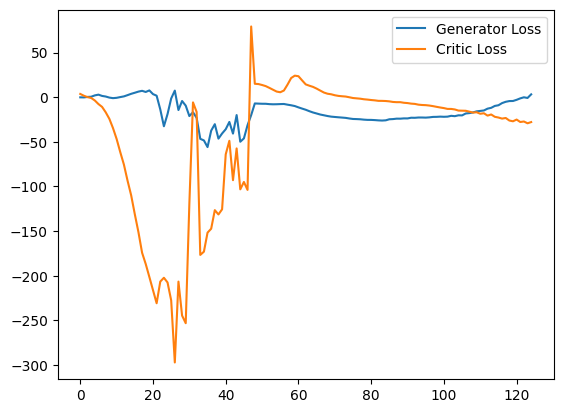

 40%|███▉      | 186/469 [00:10<00:15, 18.02it/s]

Epoch 6, step 3000: Generator loss: 7.874594678327441, critic loss: -21.623065052032462


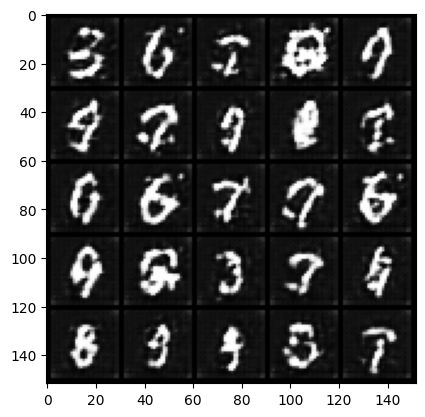

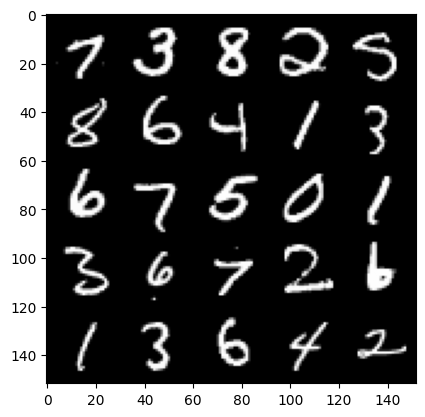

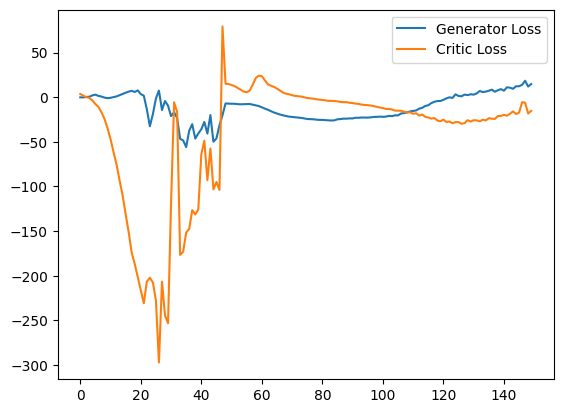

 46%|████▌     | 216/469 [00:12<00:14, 17.98it/s]

Epoch 7, step 3500: Generator loss: 19.088742705345155, critic loss: -10.377222674322123


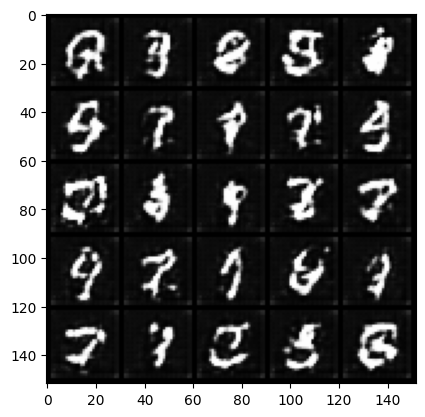

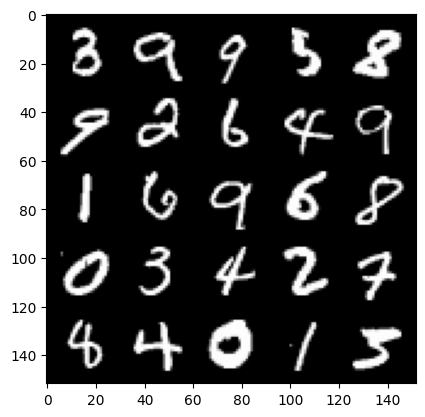

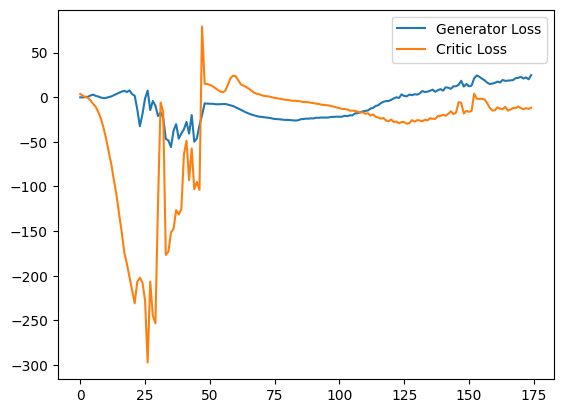

 53%|█████▎    | 248/469 [00:13<00:12, 17.84it/s]

Epoch 8, step 4000: Generator loss: 25.73426459503174, critic loss: -14.280385945034018


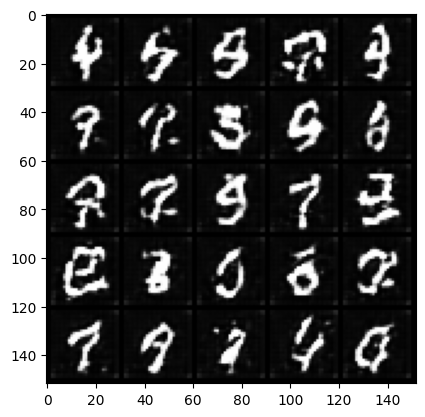

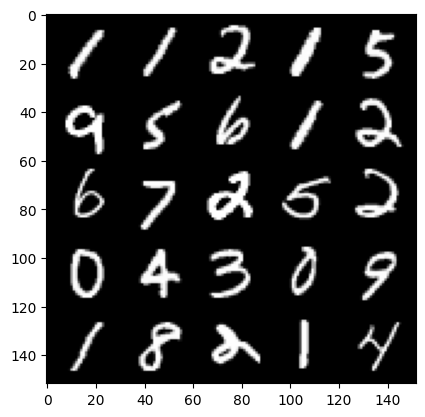

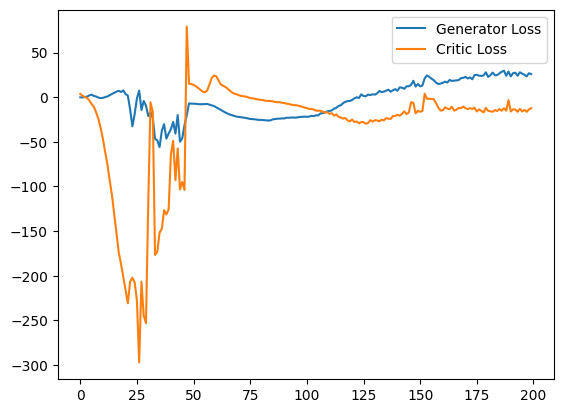

 59%|█████▉    | 278/469 [00:15<00:10, 17.97it/s]

Epoch 9, step 4500: Generator loss: 25.37007420539856, critic loss: -14.50020053415297


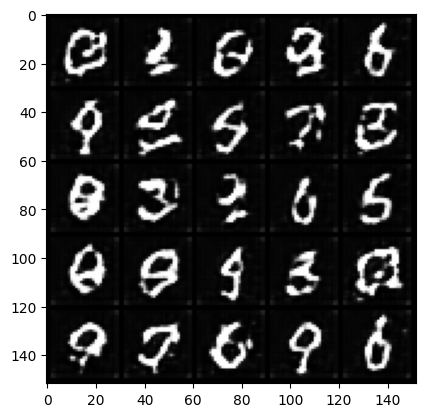

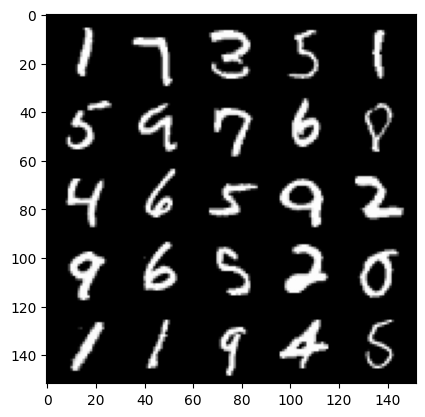

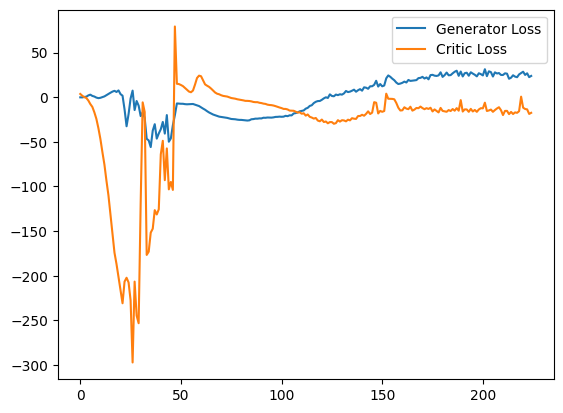

 66%|██████▌   | 310/469 [00:17<00:08, 17.86it/s]

Epoch 10, step 5000: Generator loss: 25.662197559356688, critic loss: -15.380647816944135


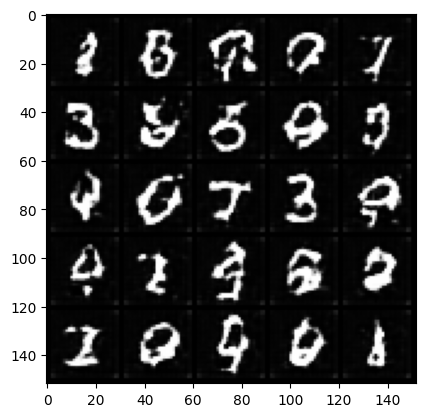

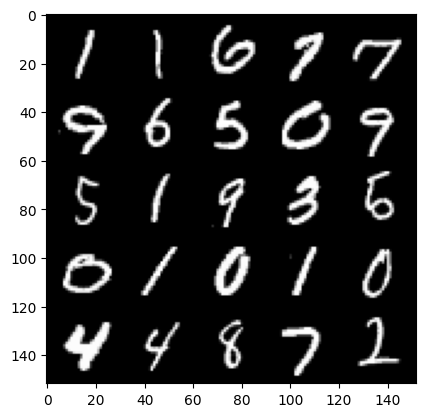

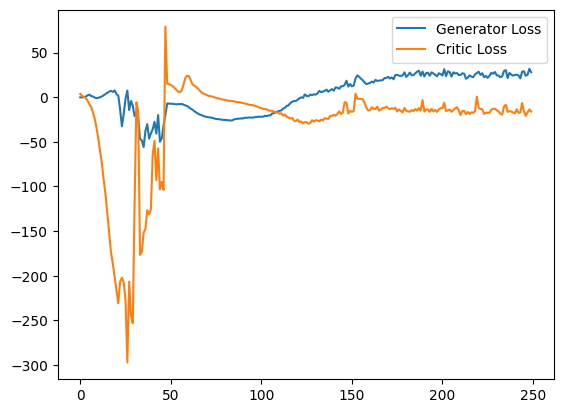

 72%|███████▏  | 340/469 [00:19<00:07, 17.98it/s]

Epoch 11, step 5500: Generator loss: 25.676238887786866, critic loss: -14.98782010126115


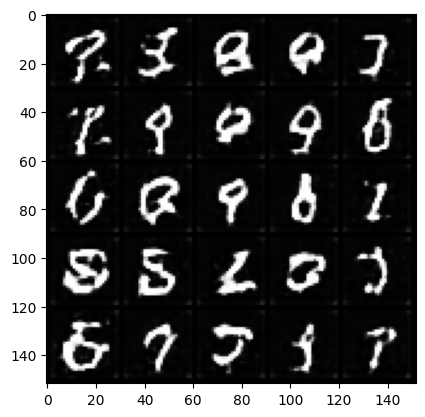

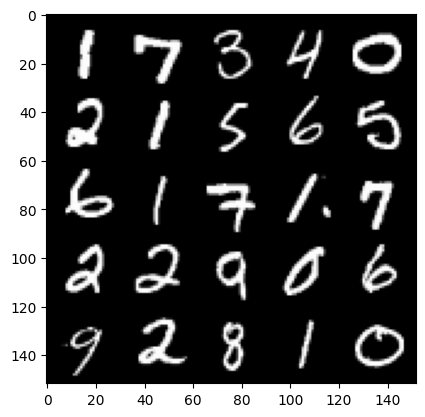

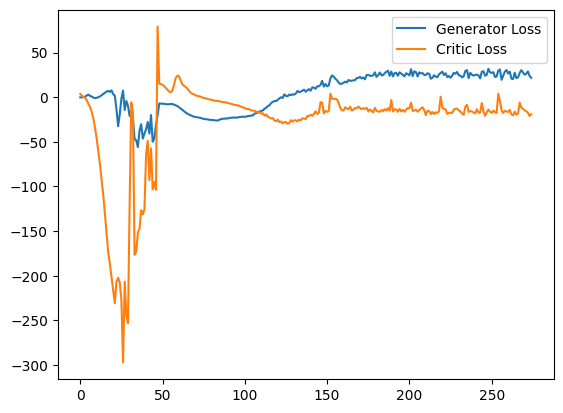

 79%|███████▉  | 372/469 [00:21<00:05, 17.60it/s]

Epoch 12, step 6000: Generator loss: 24.866690907001495, critic loss: -16.156177228307737


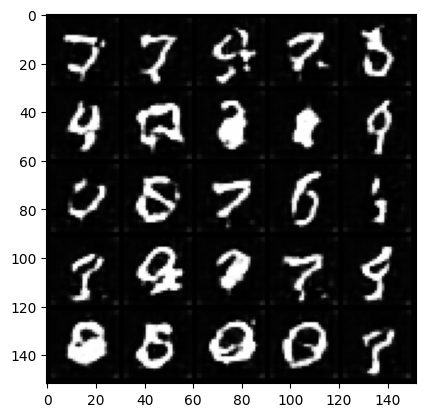

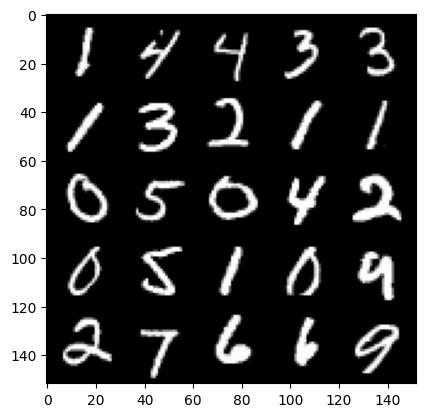

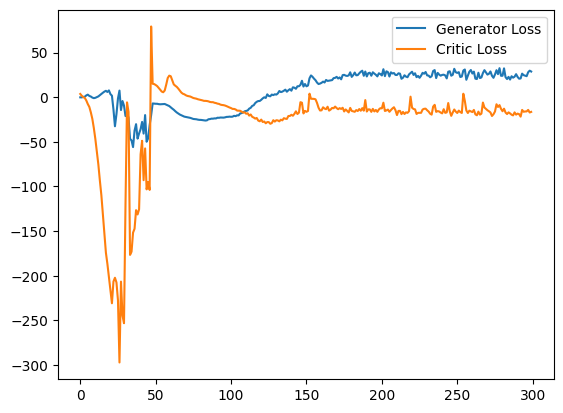

 86%|████████▌ | 402/469 [00:22<00:03, 17.99it/s]

Epoch 13, step 6500: Generator loss: 24.861230701446534, critic loss: -14.026049156641966


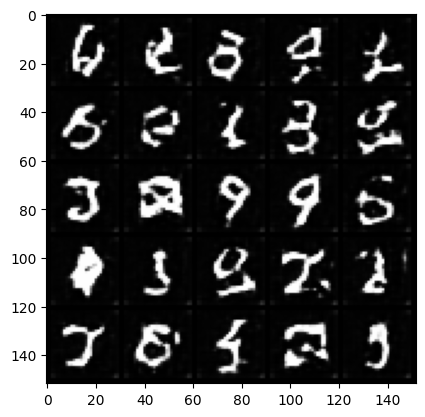

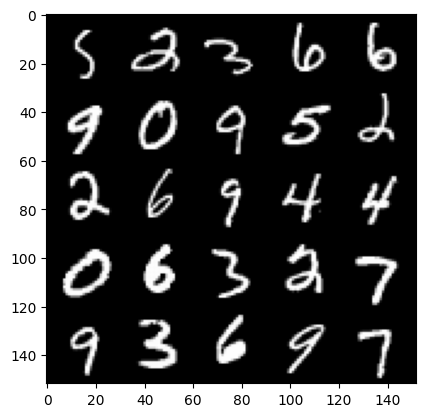

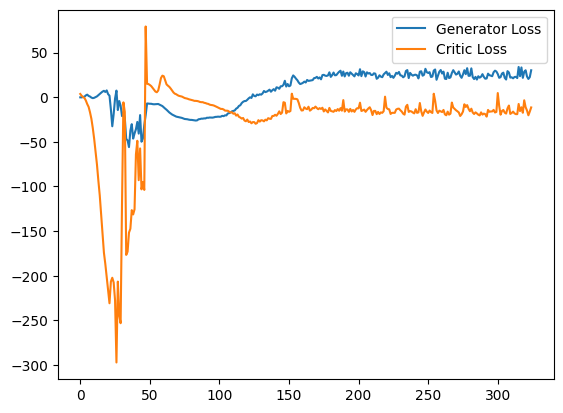

 93%|█████████▎| 434/469 [00:24<00:01, 17.83it/s]

Epoch 14, step 7000: Generator loss: 23.673103368520735, critic loss: -14.447253042602542


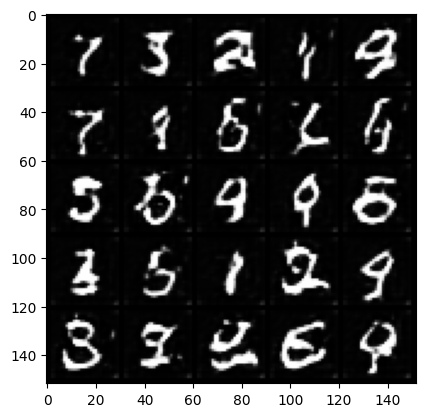

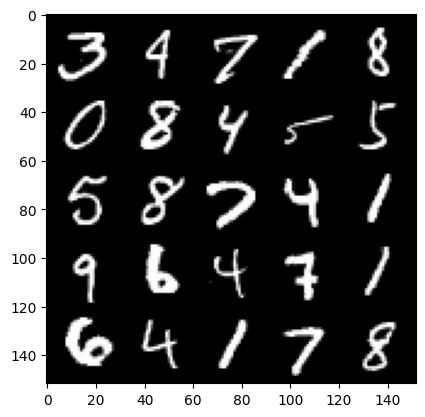

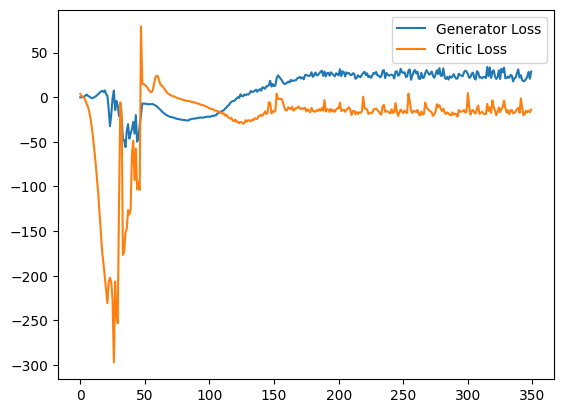

 99%|█████████▉| 464/469 [00:25<00:00, 18.02it/s]

Epoch 15, step 7500: Generator loss: 20.08024508690834, critic loss: -15.454108541512491


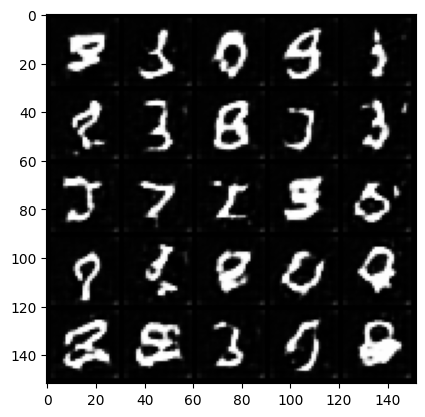

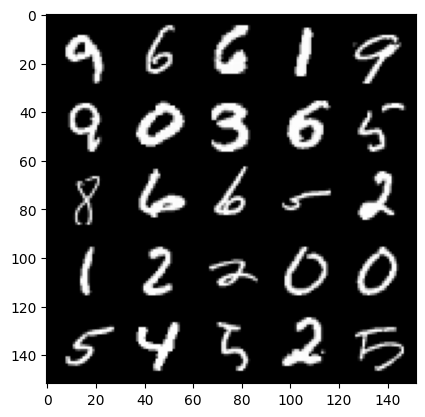

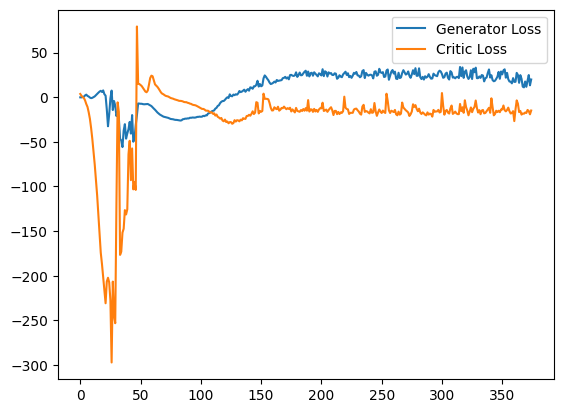

  6%|▌         | 26/469 [00:01<00:24, 17.81it/s]

Epoch 17, step 8000: Generator loss: 18.986449075087904, critic loss: -15.32258333261013


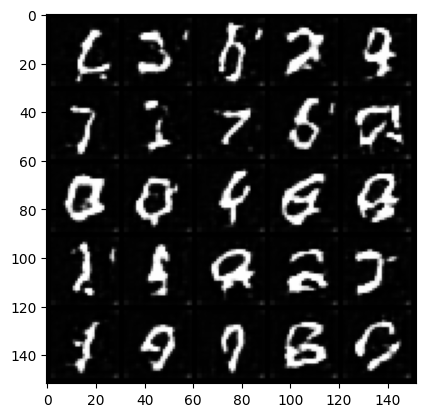

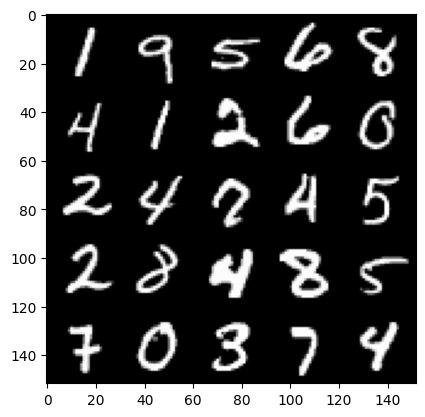

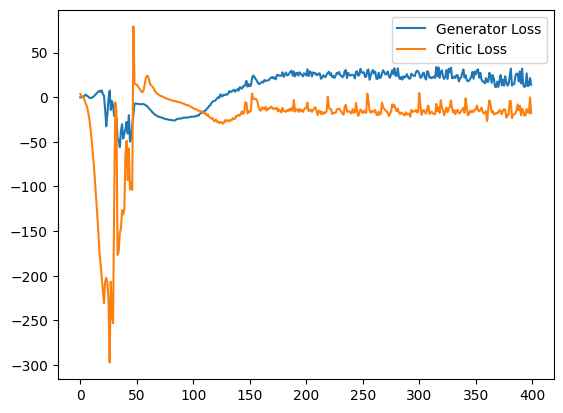

 12%|█▏        | 58/469 [00:03<00:22, 18.00it/s]

Epoch 18, step 8500: Generator loss: 21.10162572026253, critic loss: -14.242686334347729


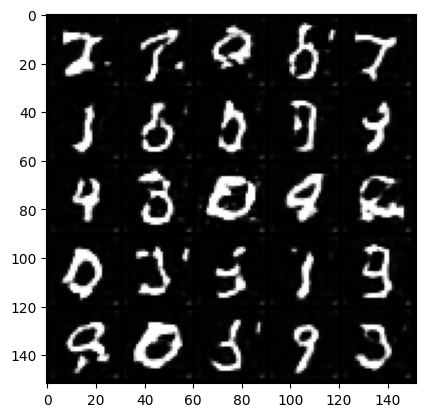

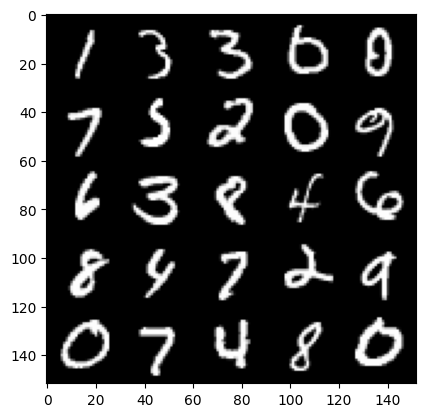

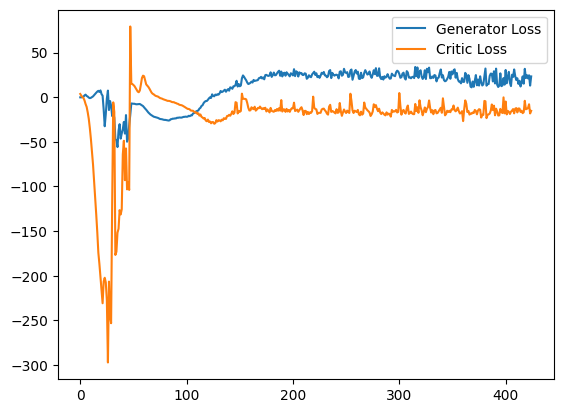

 19%|█▉        | 88/469 [00:04<00:21, 17.95it/s]

Epoch 19, step 9000: Generator loss: 16.778540921509265, critic loss: -15.433954747414578


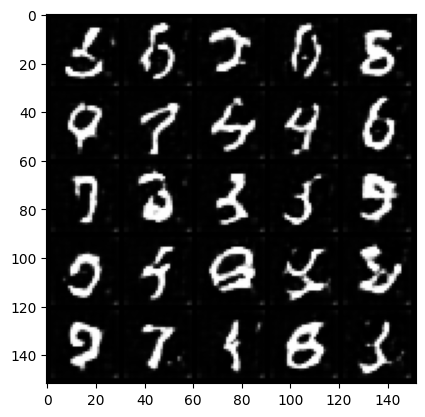

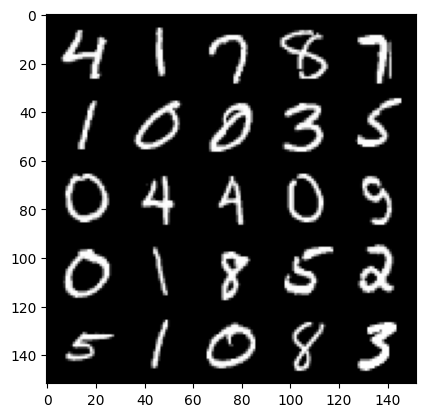

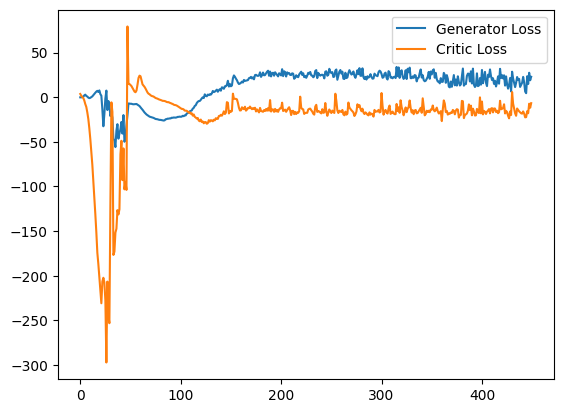

 26%|██▌       | 120/469 [00:06<00:19, 17.73it/s]

Epoch 20, step 9500: Generator loss: 18.004545193493367, critic loss: -10.848390910339349


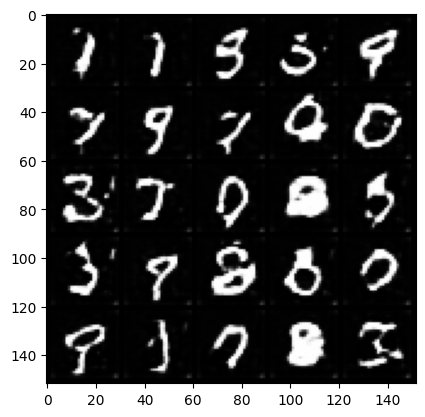

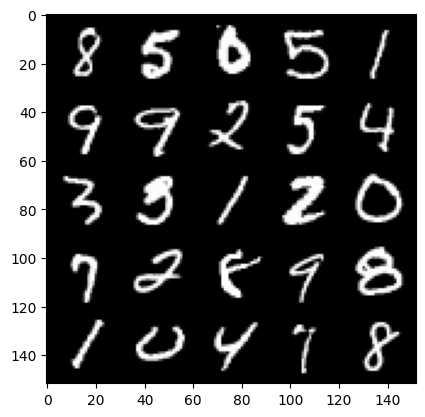

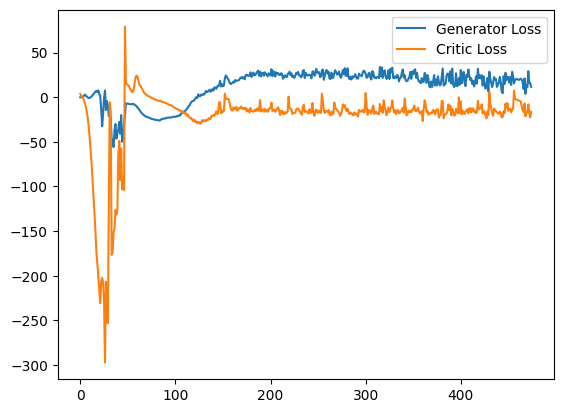

 32%|███▏      | 150/469 [00:08<00:17, 18.08it/s]

Epoch 21, step 10000: Generator loss: 12.317240278735756, critic loss: -15.243344460201243


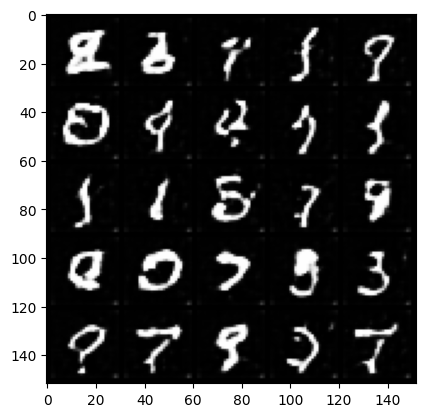

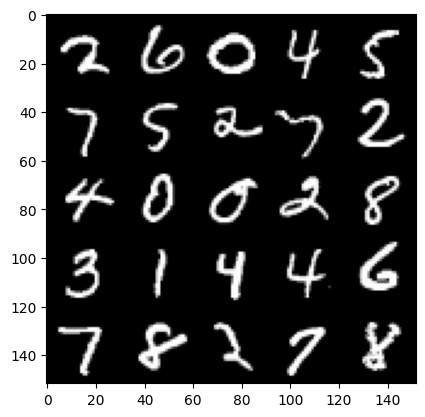

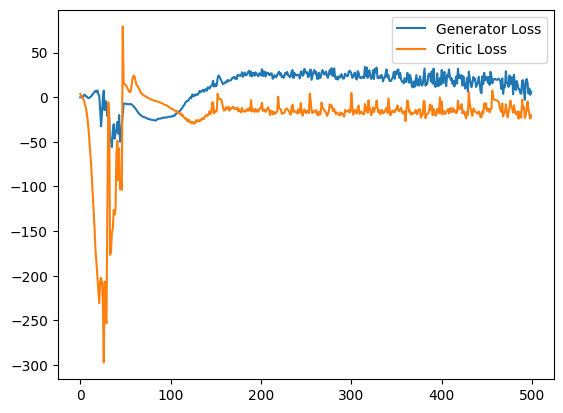

 39%|███▉      | 182/469 [00:10<00:15, 18.06it/s]

Epoch 22, step 10500: Generator loss: 10.984836134165526, critic loss: -15.717352293801303


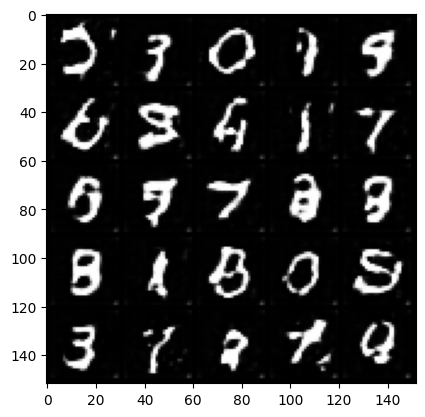

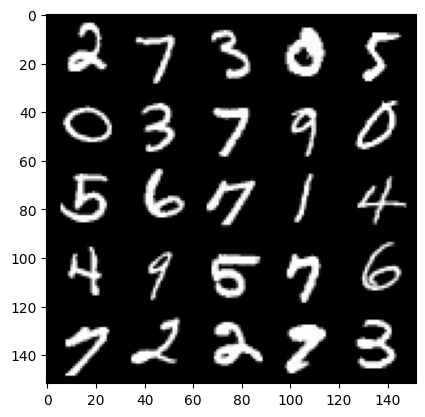

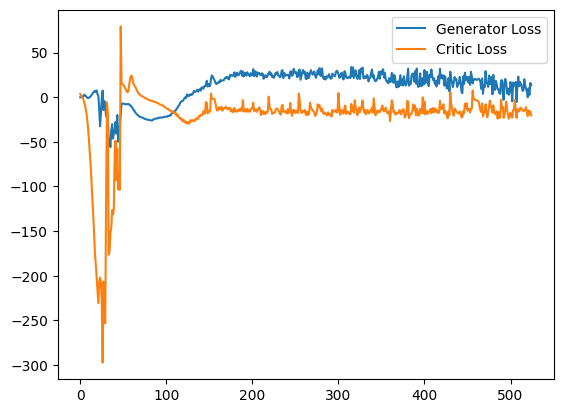

 45%|████▌     | 212/469 [00:11<00:14, 17.95it/s]

Epoch 23, step 11000: Generator loss: 10.261768413245678, critic loss: -15.365188950800889


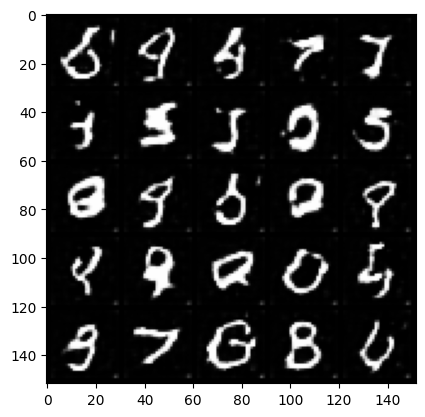

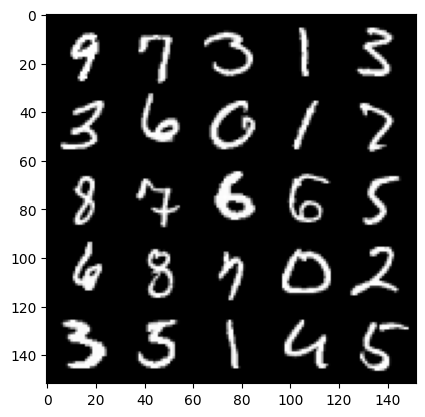

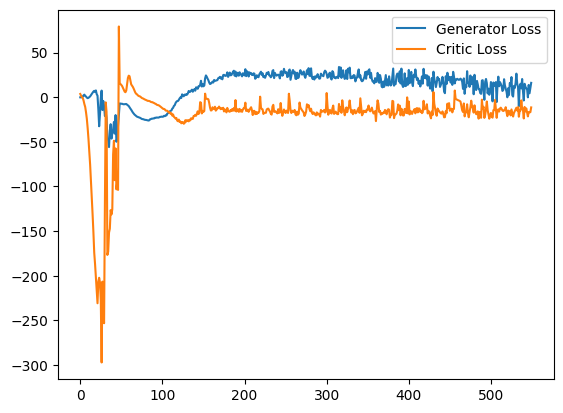

 52%|█████▏    | 244/469 [00:13<00:12, 18.18it/s]

Epoch 24, step 11500: Generator loss: 9.14892293292284, critic loss: -16.265272782182702


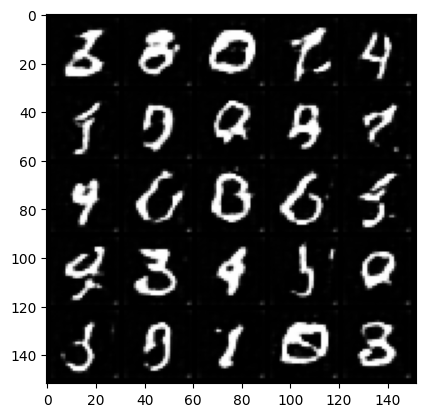

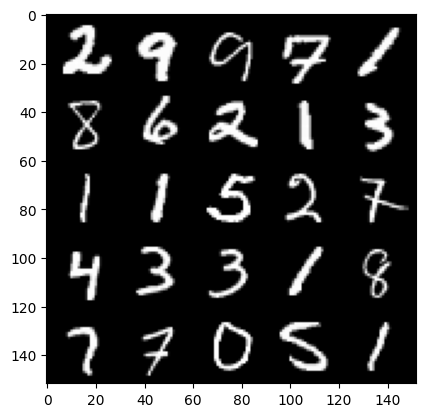

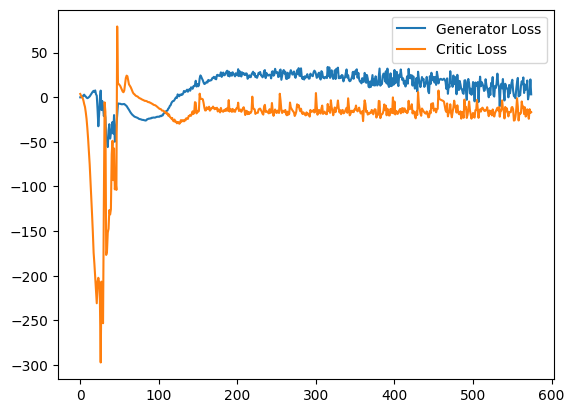

 58%|█████▊    | 274/469 [00:15<00:10, 18.08it/s]

Epoch 25, step 12000: Generator loss: 12.885597882658244, critic loss: -11.618710362136353


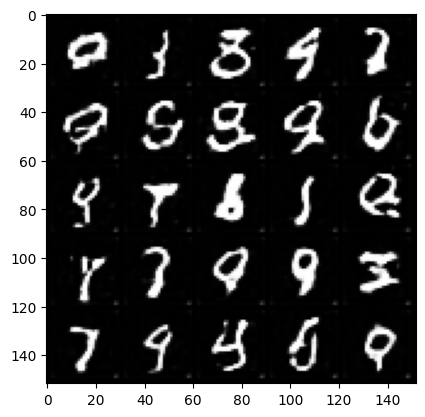

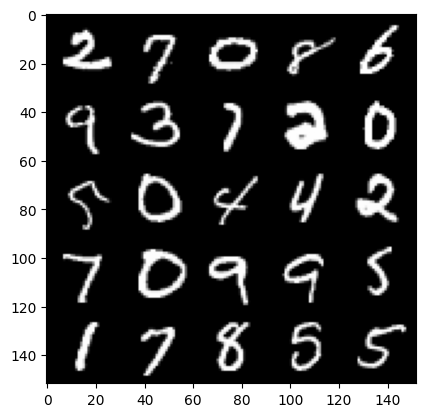

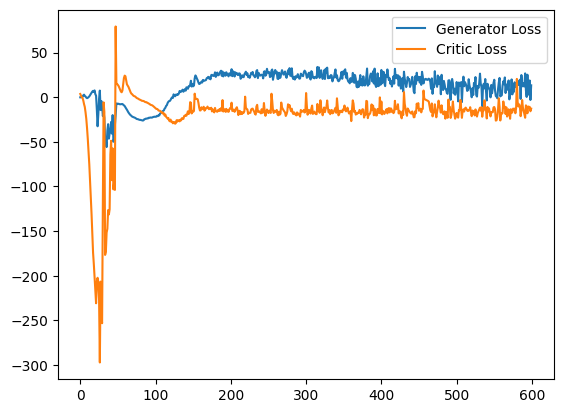

 65%|██████▌   | 306/469 [00:16<00:09, 17.98it/s]

Epoch 26, step 12500: Generator loss: 12.141432076320053, critic loss: -14.232970390367505


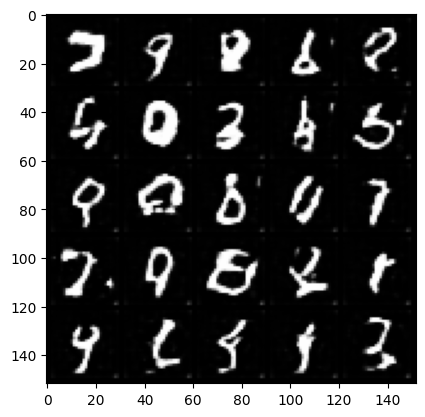

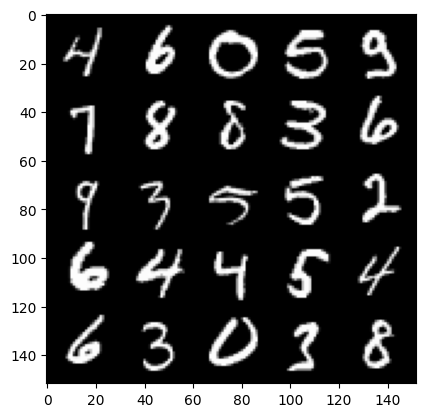

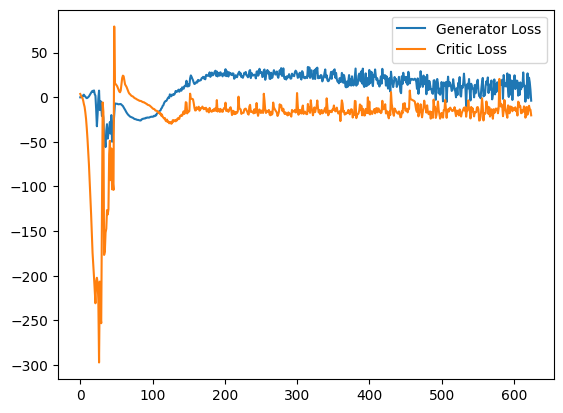

 72%|███████▏  | 336/469 [00:18<00:07, 17.87it/s]

Epoch 27, step 13000: Generator loss: 14.513403885662555, critic loss: -12.632567111039167


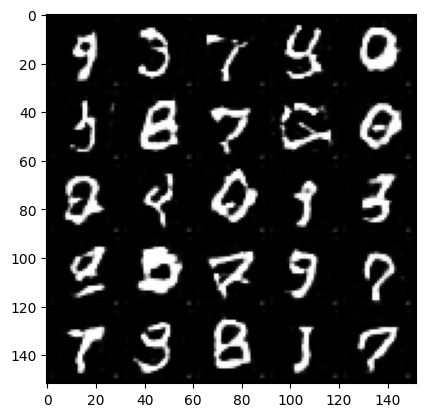

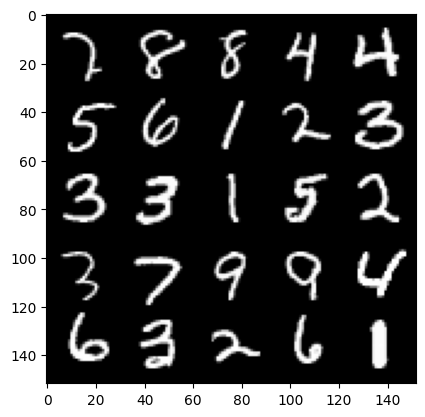

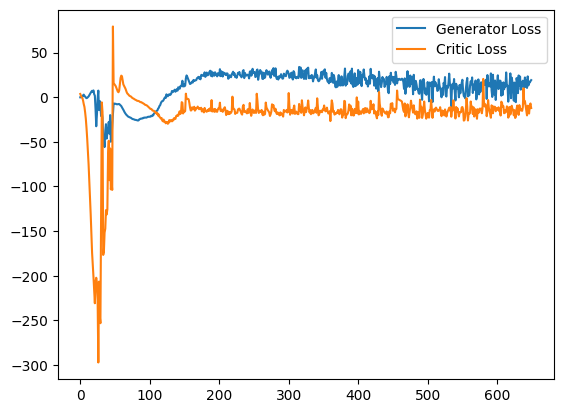

 78%|███████▊  | 368/469 [00:20<00:05, 17.90it/s]

Epoch 28, step 13500: Generator loss: 13.155954904079437, critic loss: -11.309546066641808


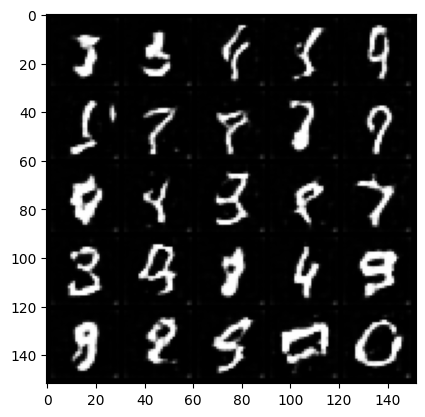

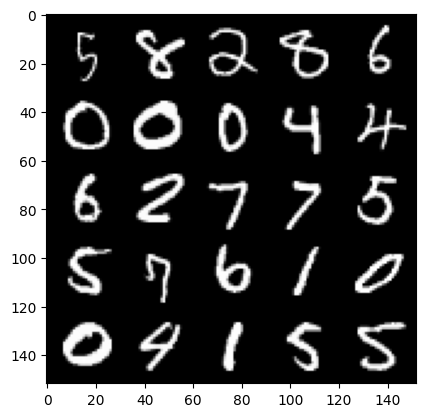

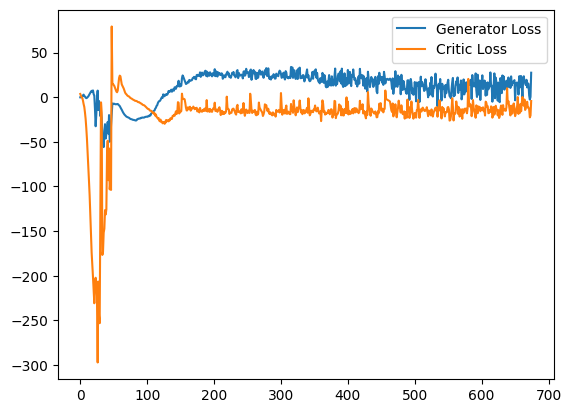

 85%|████████▍ | 398/469 [00:21<00:03, 18.71it/s]

Epoch 29, step 14000: Generator loss: 16.065503807663916, critic loss: -9.340679438793671


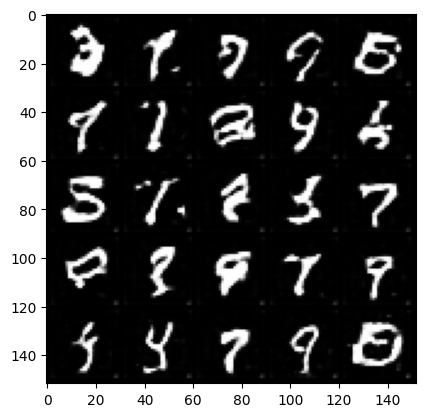

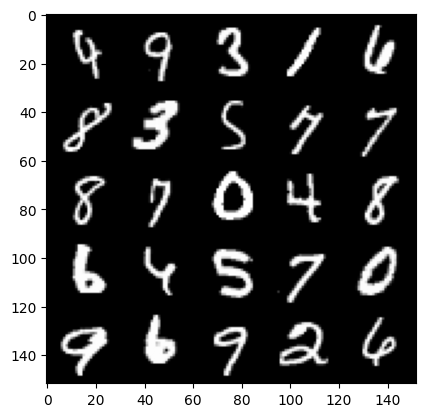

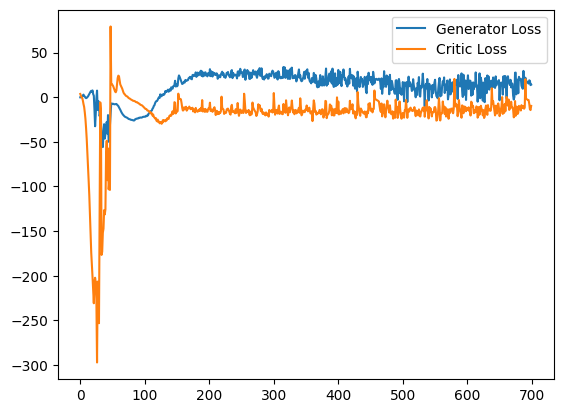

 92%|█████████▏| 430/469 [00:23<00:02, 18.02it/s]

Epoch 30, step 14500: Generator loss: 15.716125608533622, critic loss: -10.835082171499728


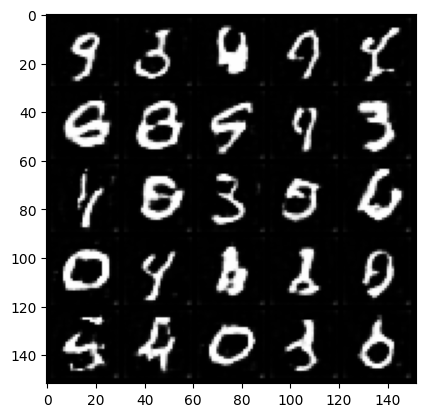

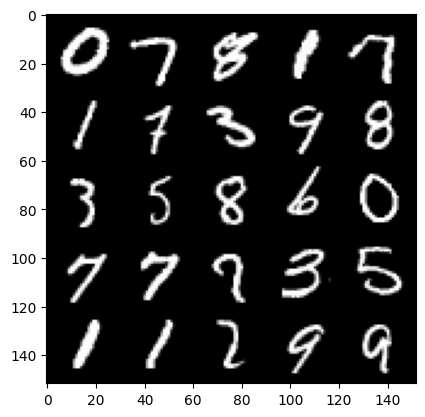

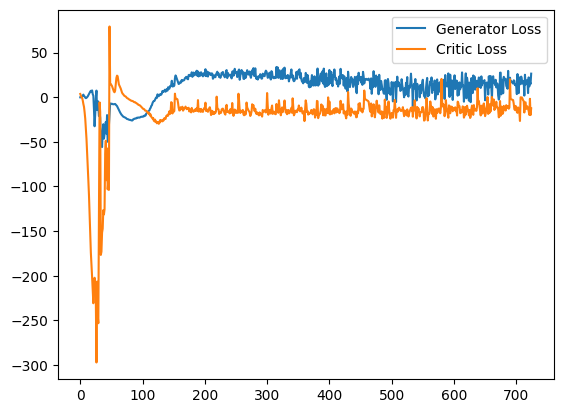

 98%|█████████▊| 460/469 [00:25<00:00, 17.85it/s]

Epoch 31, step 15000: Generator loss: 16.441159310132264, critic loss: -23.890377380025377


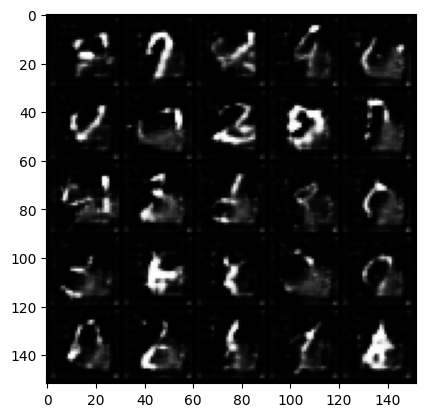

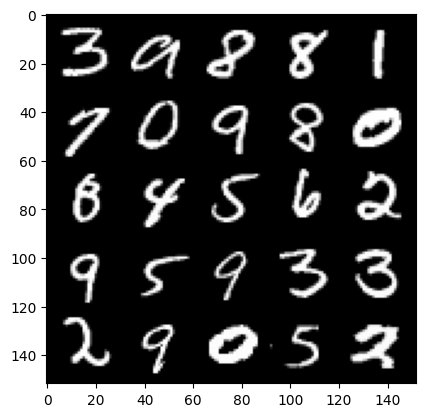

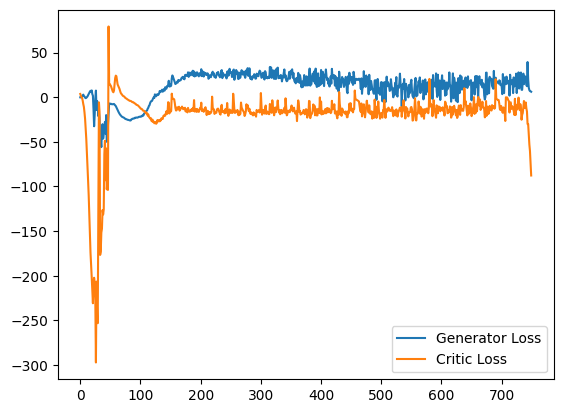

  5%|▍         | 22/469 [00:01<00:24, 18.06it/s]

Epoch 33, step 15500: Generator loss: 5.161205302238464, critic loss: -151.27361027374266


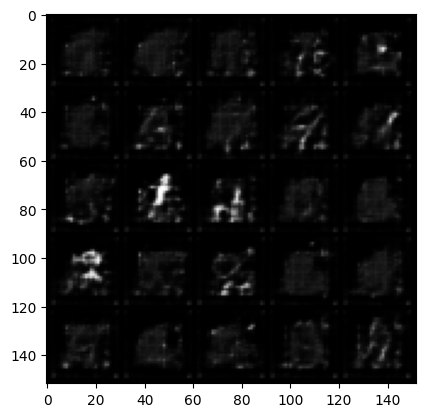

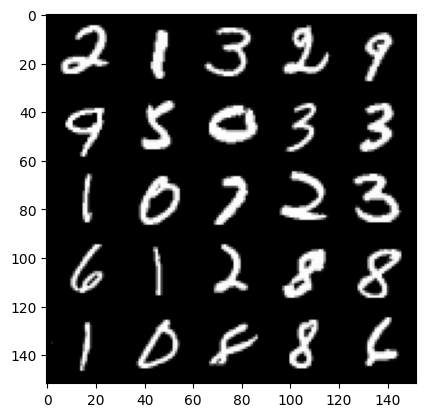

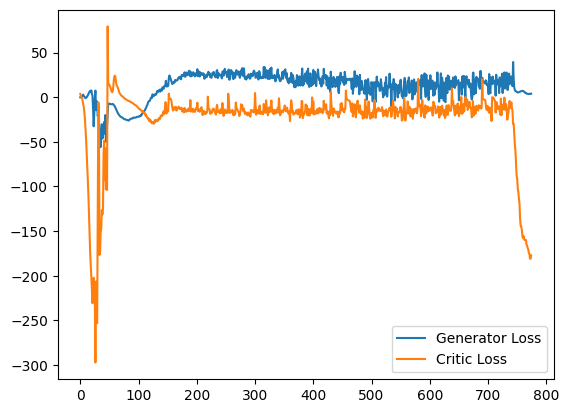

 12%|█▏        | 54/469 [00:02<00:23, 18.01it/s]

Epoch 34, step 16000: Generator loss: 1.9314764566496014, critic loss: -235.0491175048827


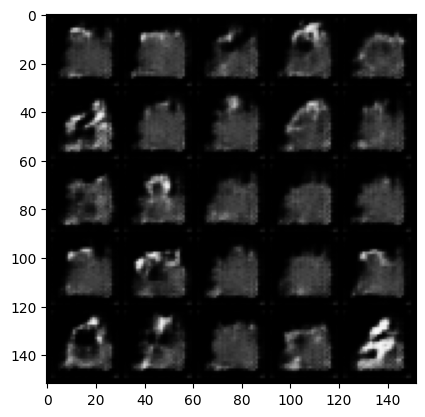

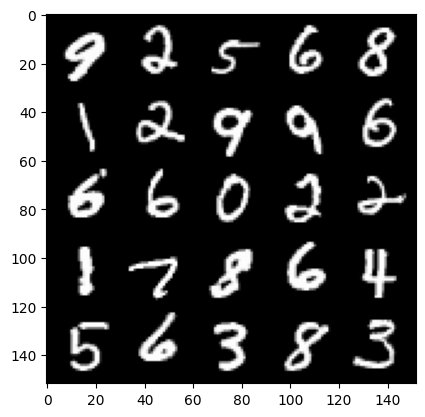

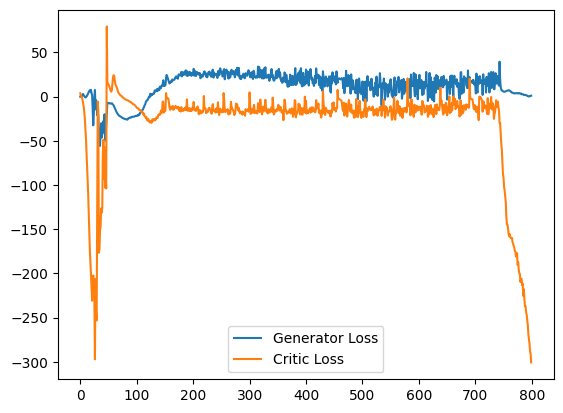

 18%|█▊        | 84/469 [00:04<00:21, 17.87it/s]

Epoch 35, step 16500: Generator loss: -0.7994181197285652, critic loss: -396.70247130432136


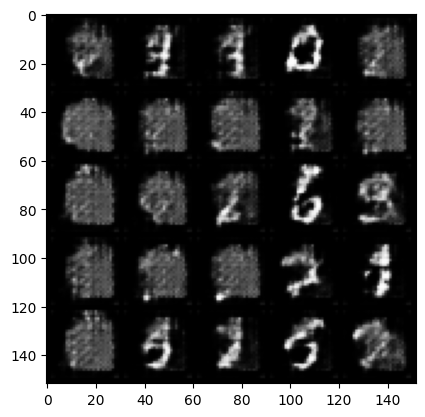

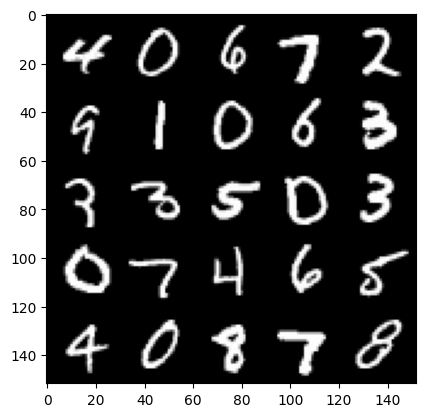

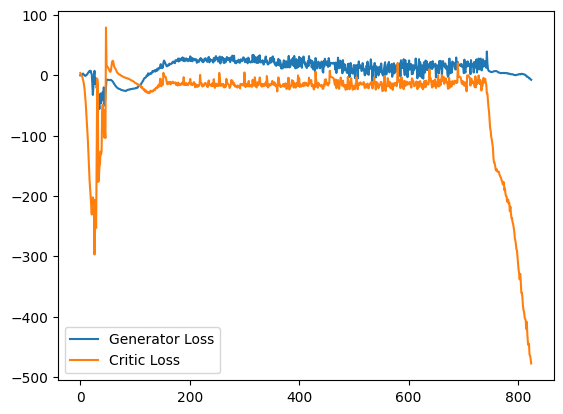

 25%|██▍       | 116/469 [00:06<00:19, 18.02it/s]

Epoch 36, step 17000: Generator loss: -15.281401193618775, critic loss: -550.0241425598147


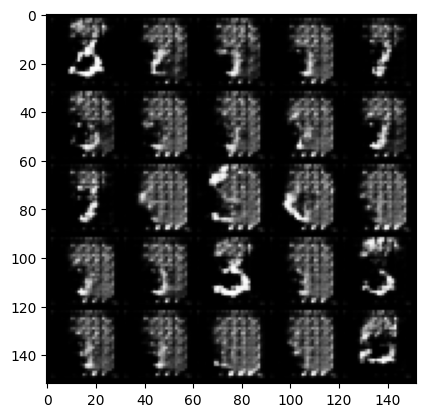

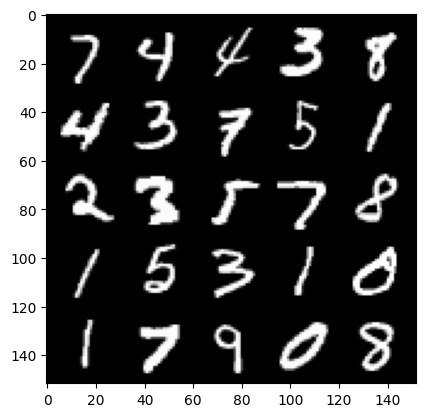

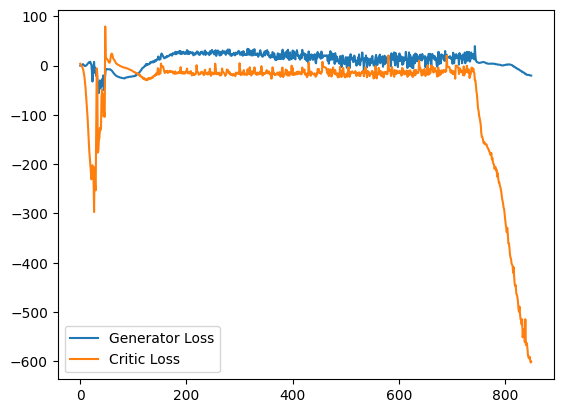

 31%|███       | 146/469 [00:08<00:17, 18.05it/s]

Epoch 37, step 17500: Generator loss: -22.348657611072063, critic loss: -445.5158339630127


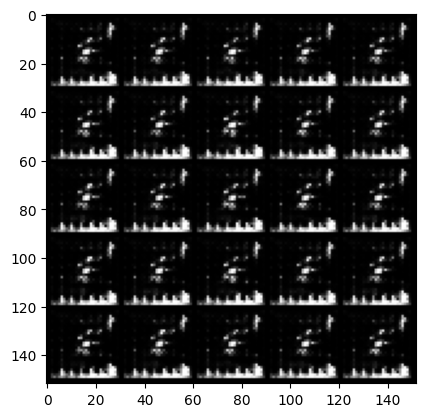

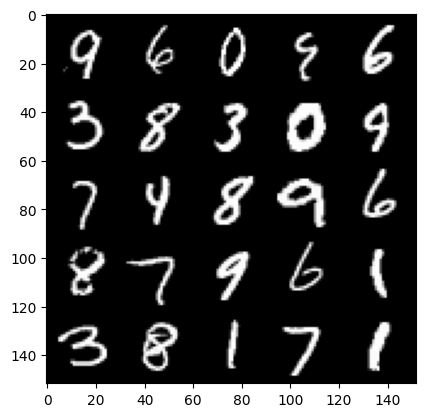

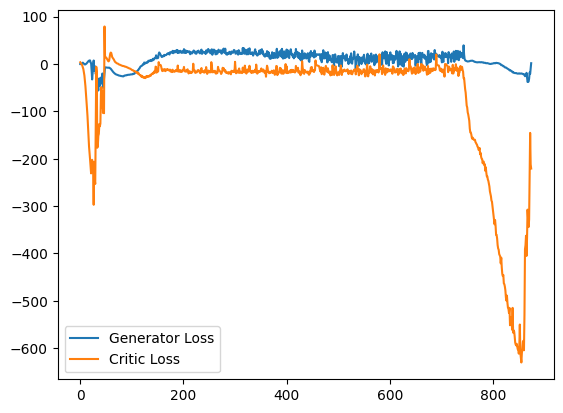

 38%|███▊      | 178/469 [00:09<00:16, 18.17it/s]

Epoch 38, step 18000: Generator loss: -7.131536054700613, critic loss: -57.51168953895571


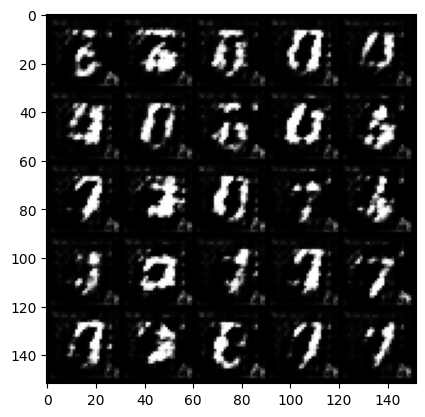

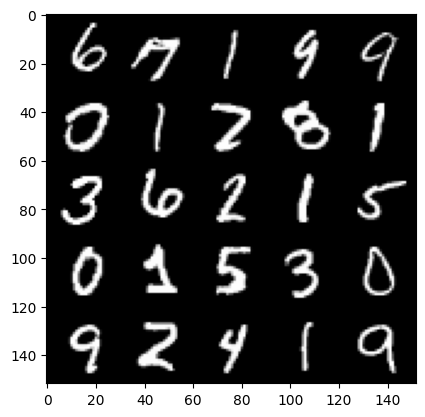

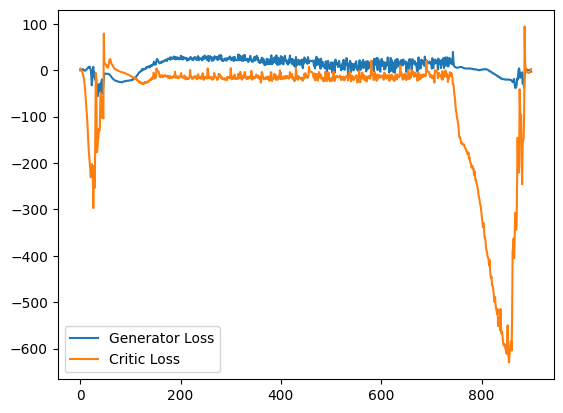

 44%|████▍     | 208/469 [00:11<00:14, 18.14it/s]

Epoch 39, step 18500: Generator loss: -2.7409950675964354, critic loss: 0.025641920757292862


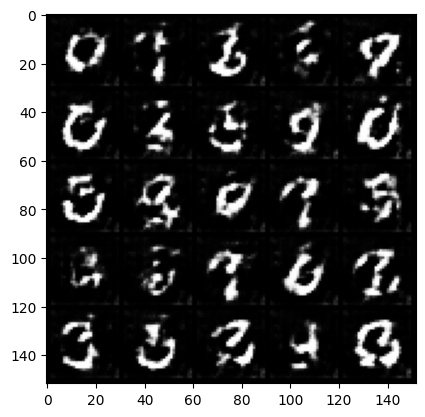

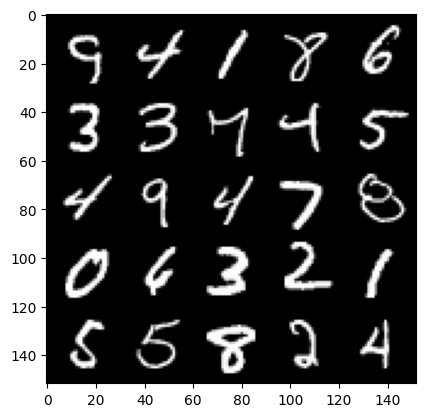

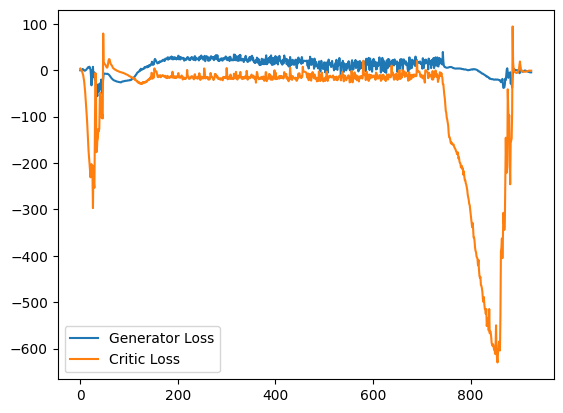

 51%|█████     | 240/469 [00:13<00:12, 18.49it/s]

Epoch 40, step 19000: Generator loss: -3.2632867356538773, critic loss: -1.4009525021076183


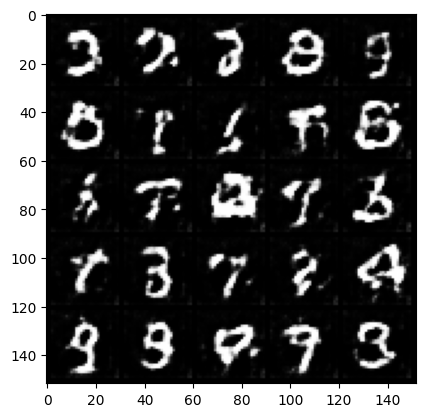

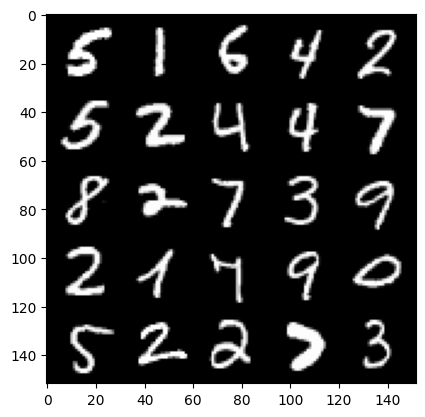

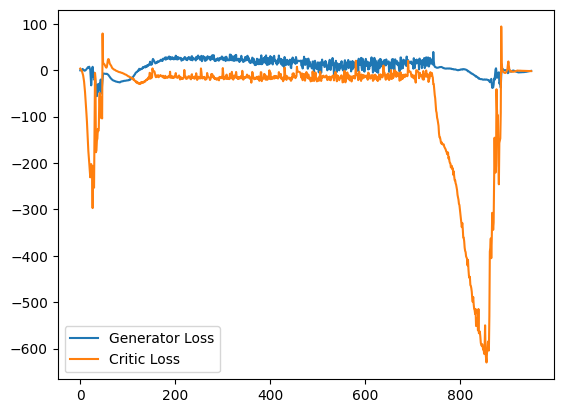

 58%|█████▊    | 270/469 [00:14<00:11, 17.80it/s]

Epoch 41, step 19500: Generator loss: -0.0926155161075294, critic loss: -2.6180093447923665


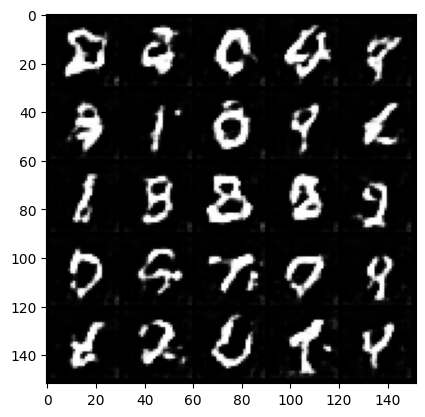

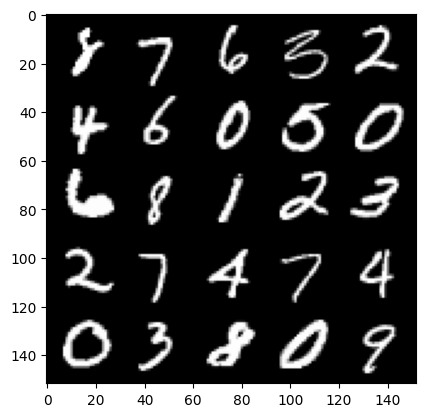

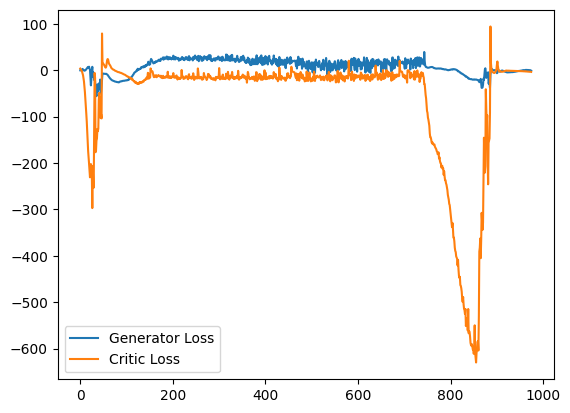

 64%|██████▍   | 302/469 [00:16<00:09, 18.13it/s]

Epoch 42, step 20000: Generator loss: 0.09663758791983128, critic loss: -2.2861713296294193


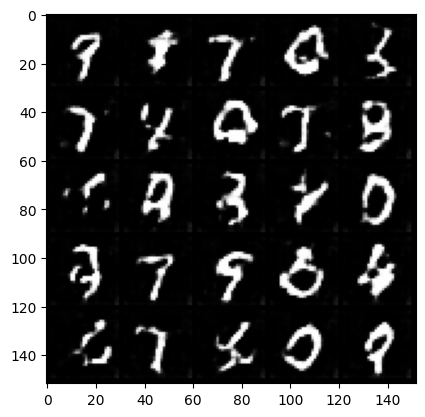

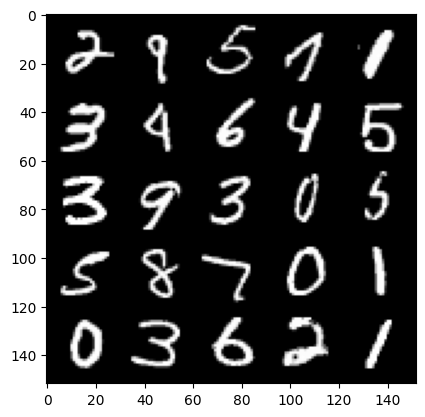

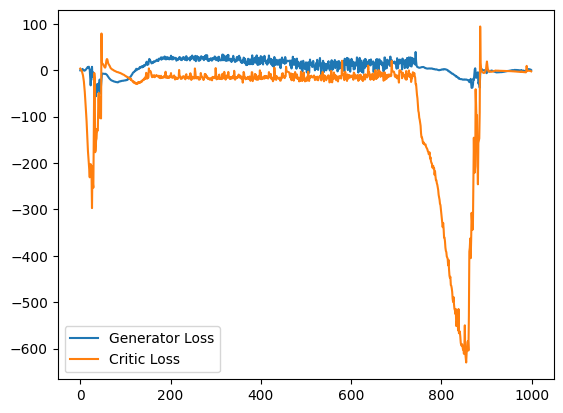

 71%|███████   | 333/469 [00:18<00:07, 18.52it/s]

Epoch 43, step 20500: Generator loss: -0.9284278169646859, critic loss: -3.692859665668009


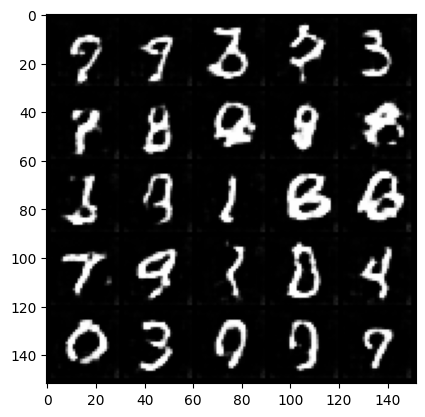

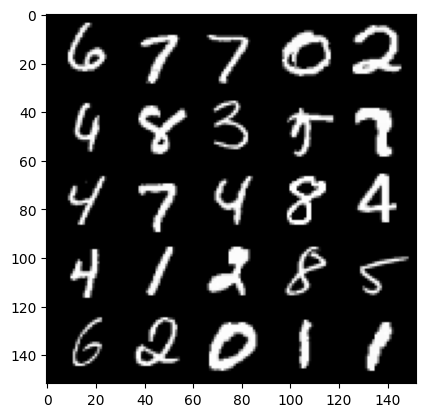

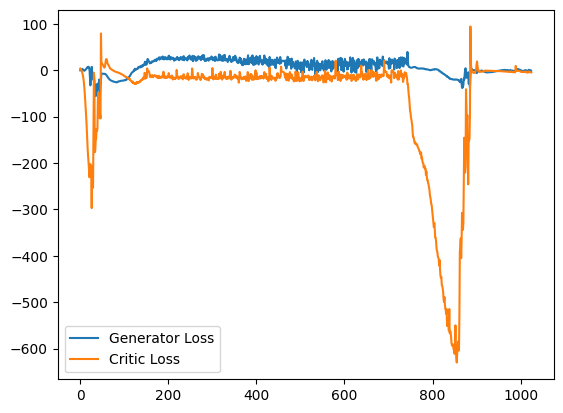

 78%|███████▊  | 364/469 [00:20<00:05, 18.20it/s]

Epoch 44, step 21000: Generator loss: -0.7588987846747041, critic loss: -3.4957476315259957


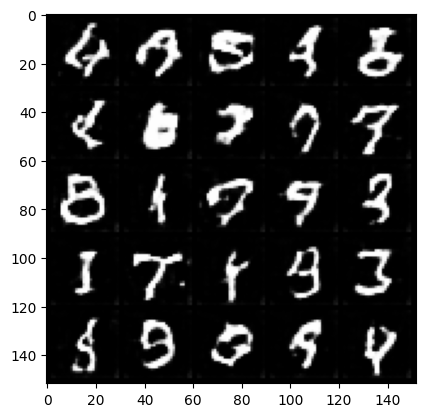

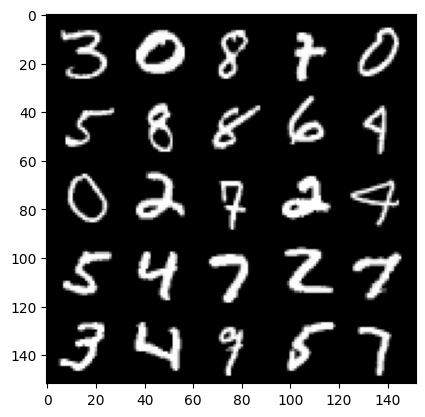

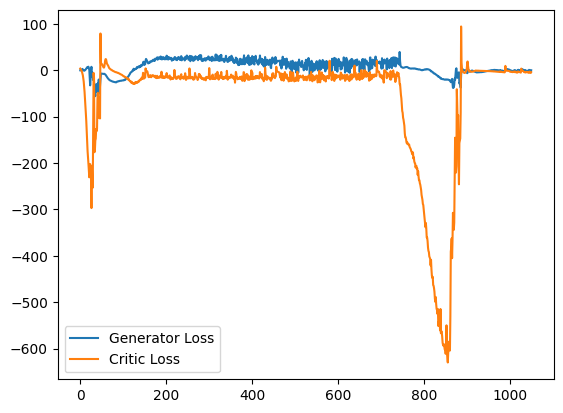

 84%|████████▍ | 394/469 [00:21<00:04, 18.28it/s]

Epoch 45, step 21500: Generator loss: -0.8591759208962322, critic loss: -3.984827436876295


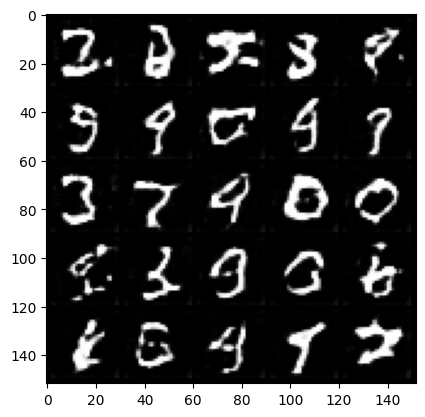

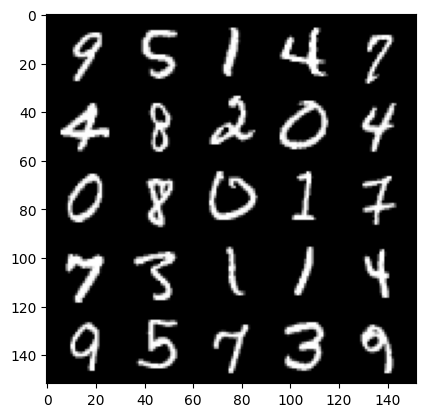

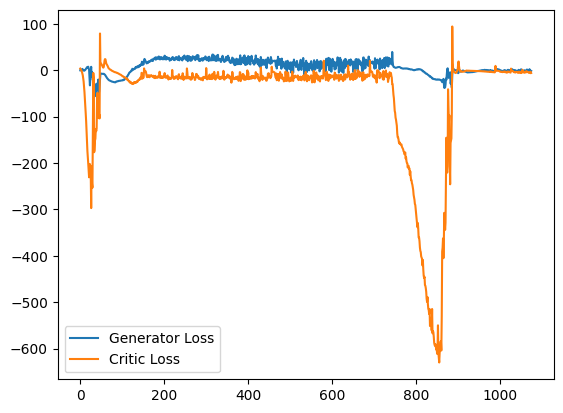

 91%|█████████ | 426/469 [00:23<00:02, 18.11it/s]

Epoch 46, step 22000: Generator loss: -2.394841577447951, critic loss: -4.222594415175915


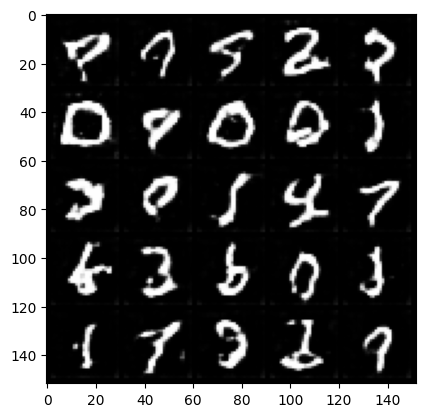

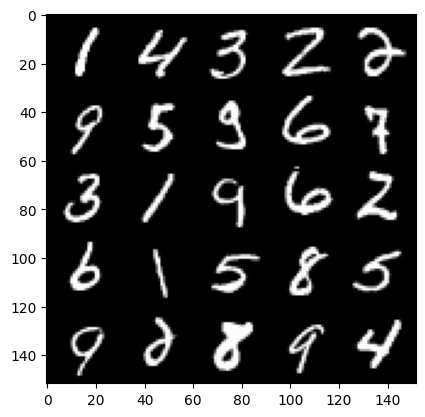

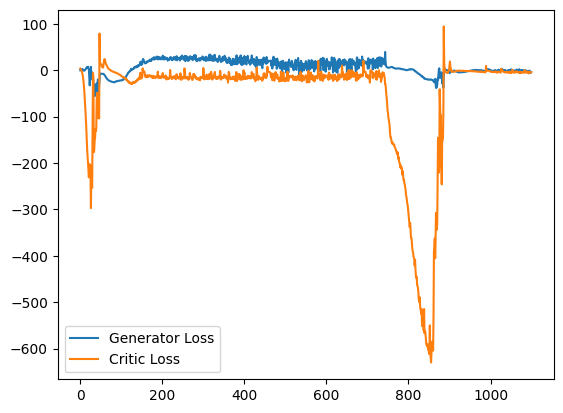

 97%|█████████▋| 456/469 [00:25<00:00, 17.82it/s]

Epoch 47, step 22500: Generator loss: -6.7548211534768345, critic loss: -4.45619331794381


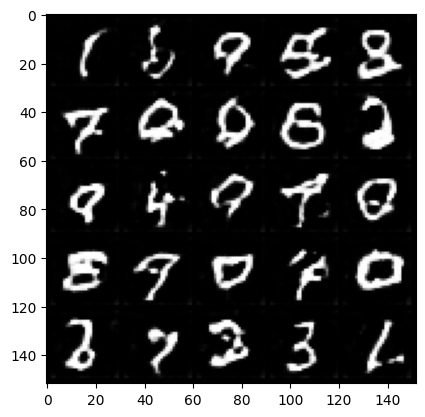

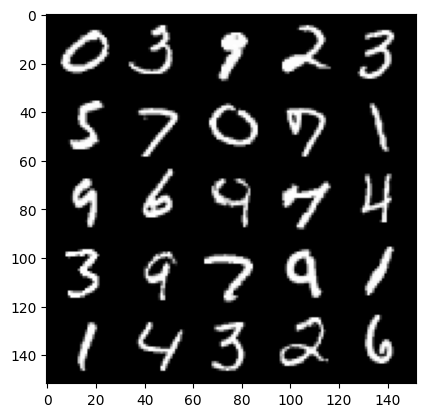

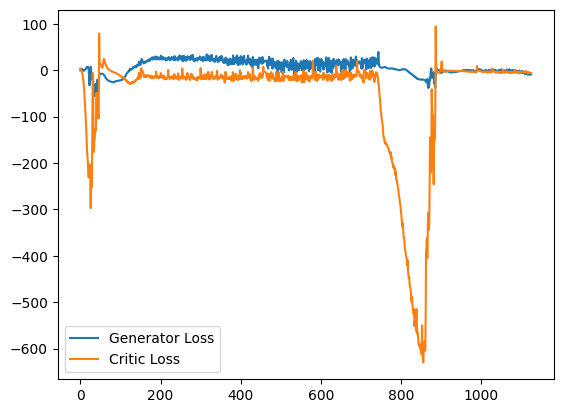

  4%|▍         | 18/469 [00:00<00:24, 18.11it/s]

Epoch 49, step 23000: Generator loss: -9.70559601289034, critic loss: -4.958075993037224


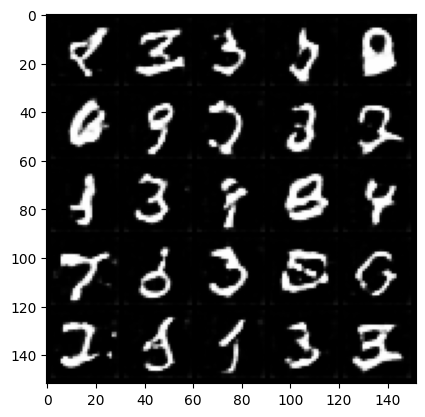

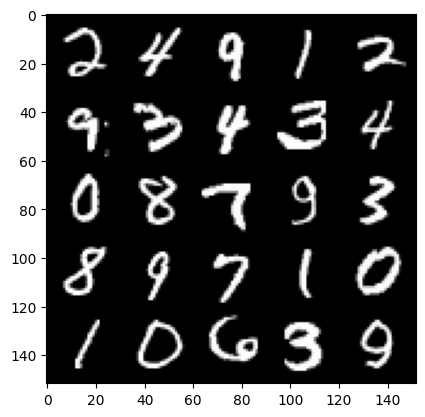

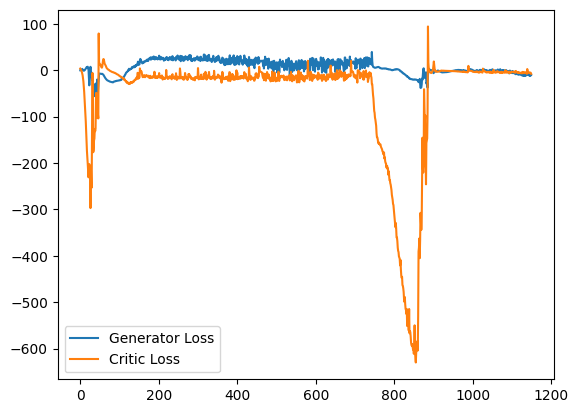

 11%|█         | 50/469 [00:02<00:24, 17.28it/s]

Epoch 50, step 23500: Generator loss: -10.724821547567844, critic loss: -4.057276868760586


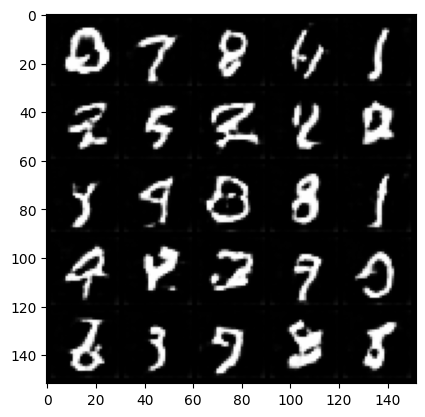

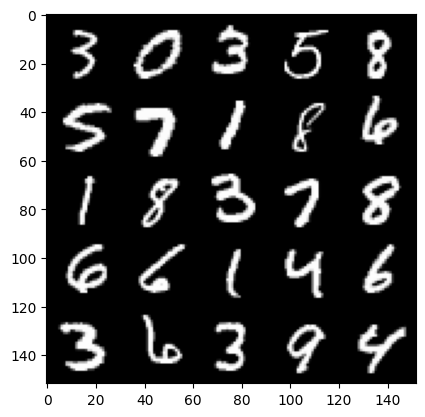

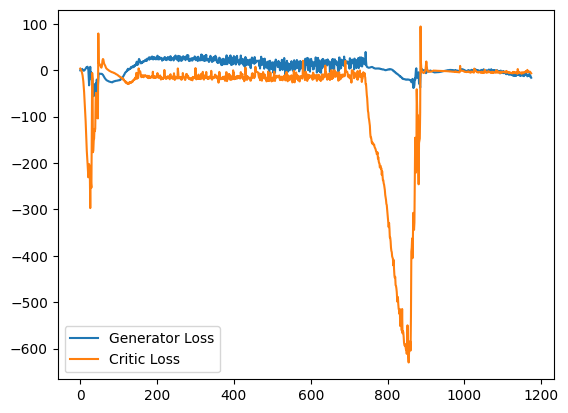

 17%|█▋        | 80/469 [00:04<00:21, 18.10it/s]

Epoch 51, step 24000: Generator loss: -14.101339777231216, critic loss: -4.798400073945522


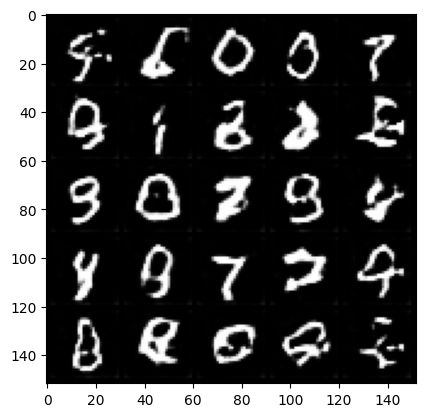

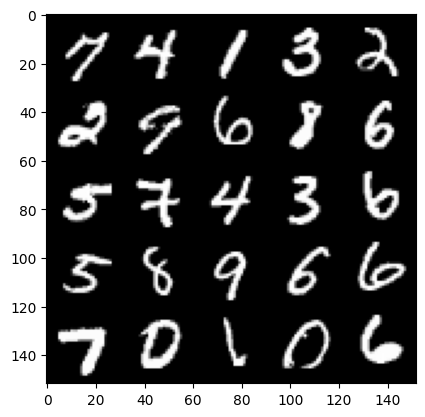

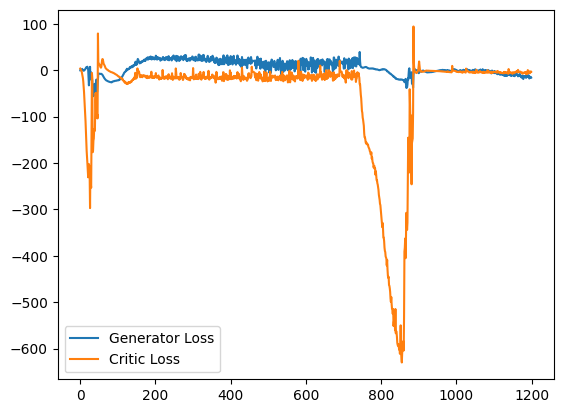

 24%|██▍       | 112/469 [00:06<00:19, 18.02it/s]

Epoch 52, step 24500: Generator loss: -16.37095597720146, critic loss: -4.833681999230378


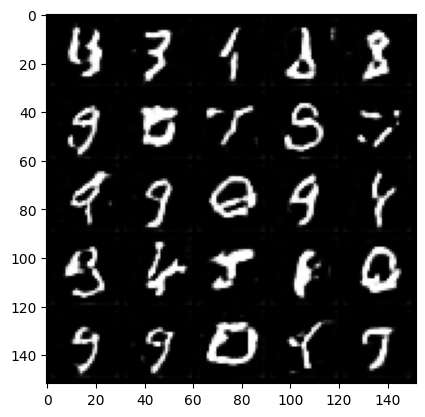

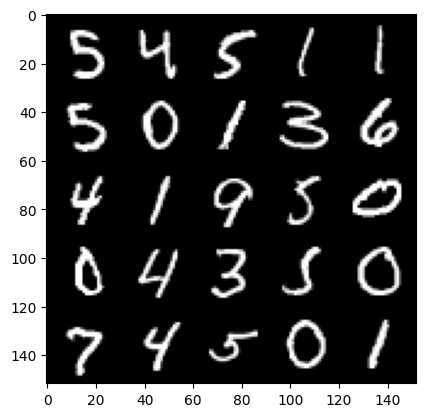

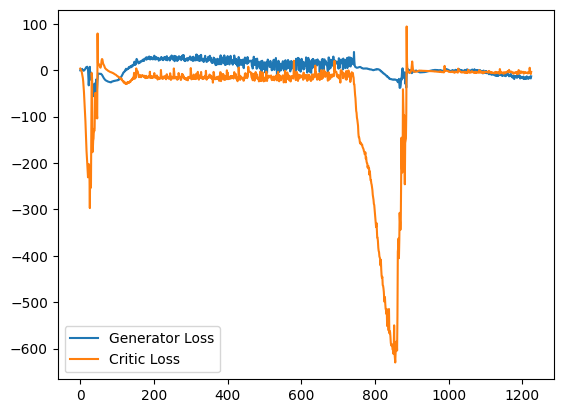

 30%|███       | 142/469 [00:07<00:18, 18.00it/s]

Epoch 53, step 25000: Generator loss: -16.0559308167696, critic loss: -5.009258921921252


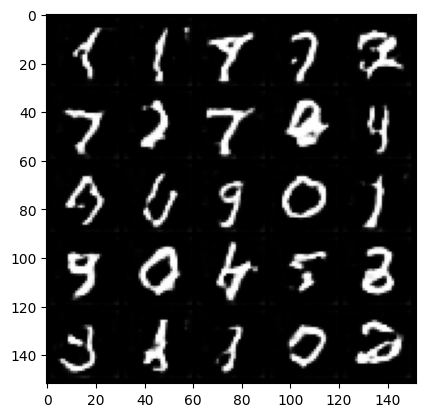

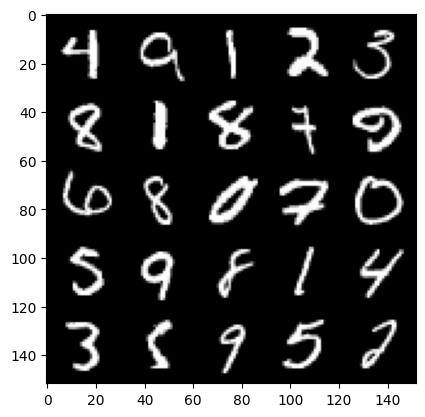

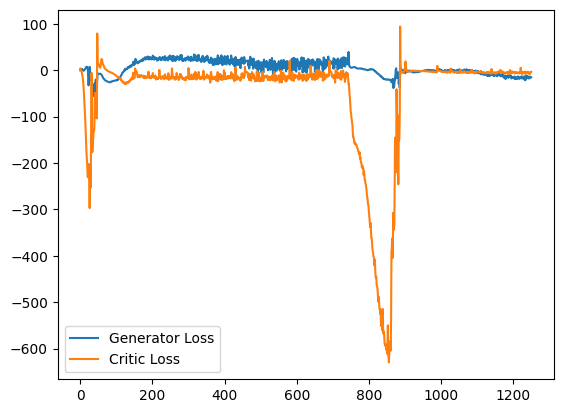

 37%|███▋      | 174/469 [00:09<00:16, 18.26it/s]

Epoch 54, step 25500: Generator loss: -14.759237045541406, critic loss: -5.070045236730573


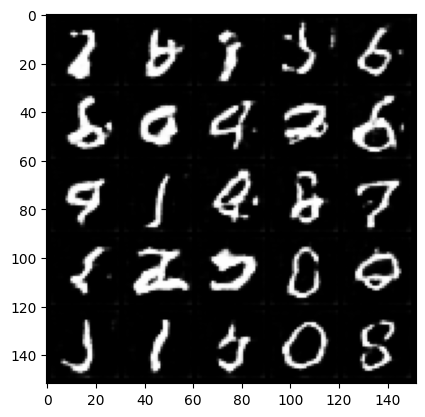

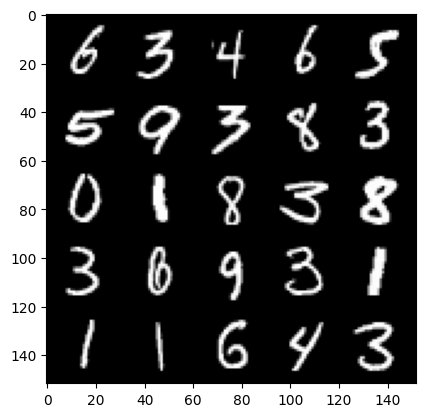

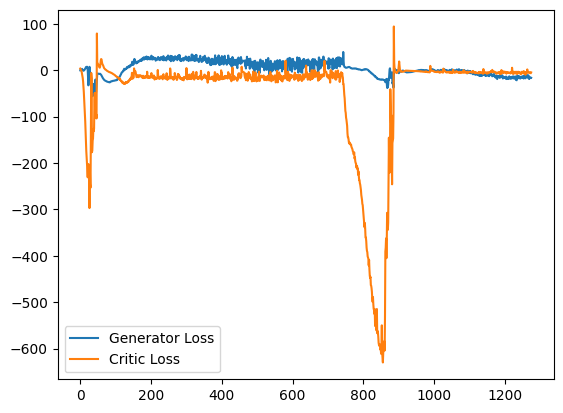

 43%|████▎     | 204/469 [00:11<00:14, 18.13it/s]

Epoch 55, step 26000: Generator loss: -15.046676830813288, critic loss: -5.486580319273473


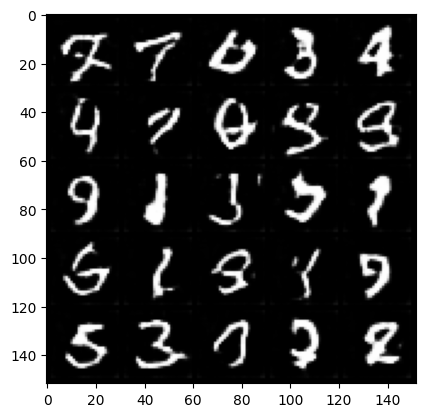

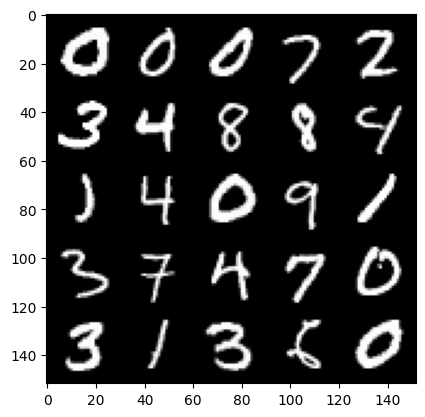

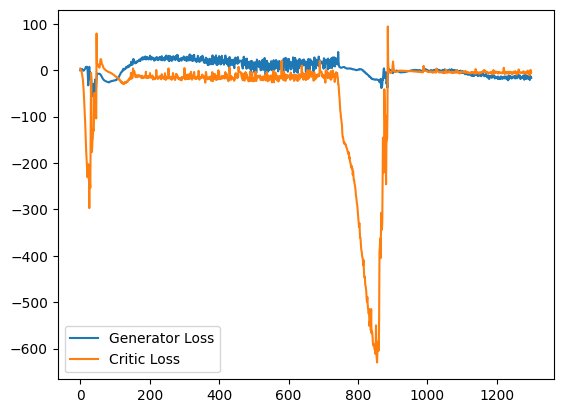

 50%|█████     | 236/469 [00:13<00:12, 18.24it/s]

Epoch 56, step 26500: Generator loss: -16.02644110749662, critic loss: -3.9440743365764614


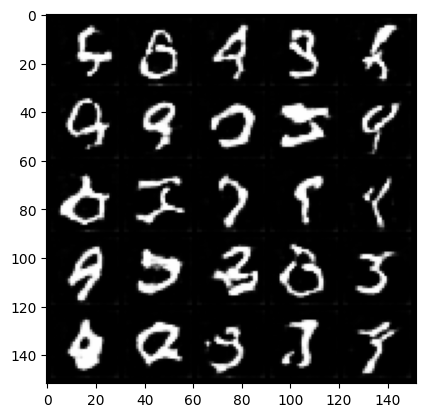

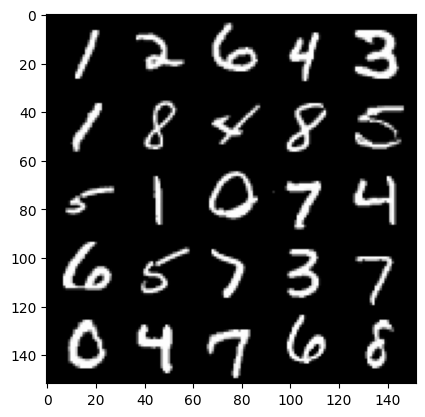

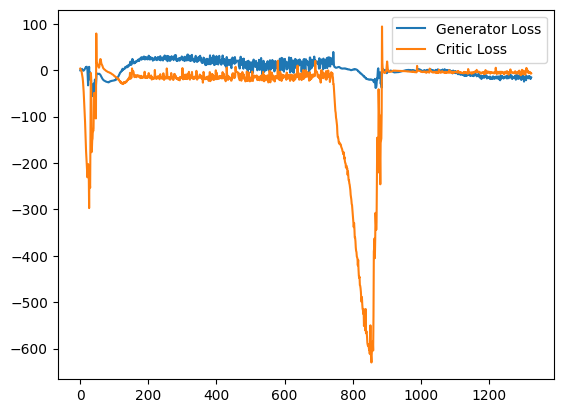

 57%|█████▋    | 266/469 [00:14<00:11, 18.28it/s]

Epoch 57, step 27000: Generator loss: -17.775403964459898, critic loss: -4.969923339986791


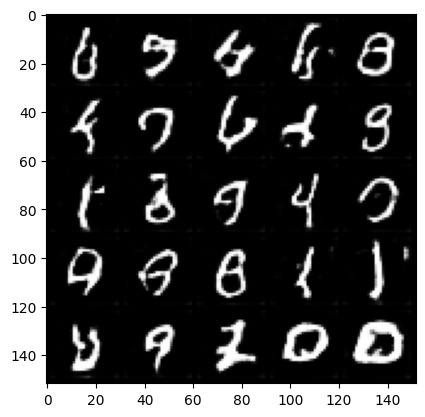

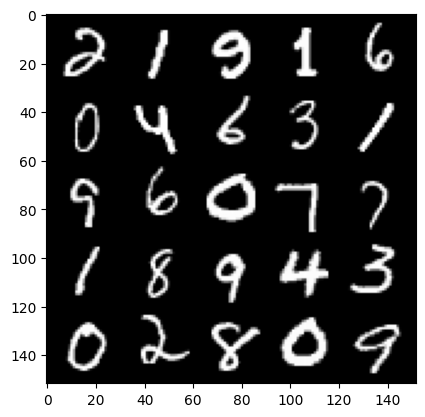

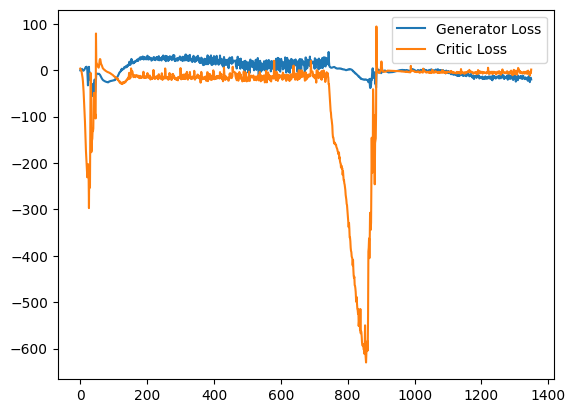

 64%|██████▎   | 298/469 [00:16<00:09, 18.10it/s]

Epoch 58, step 27500: Generator loss: -14.927567275583744, critic loss: -2.941826781219239


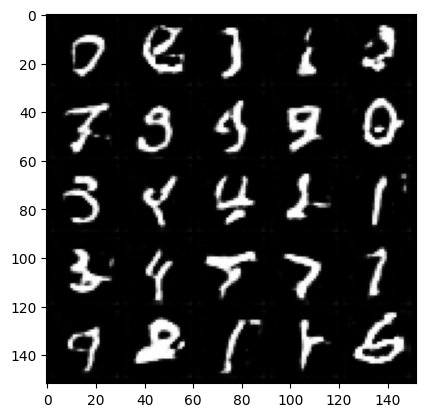

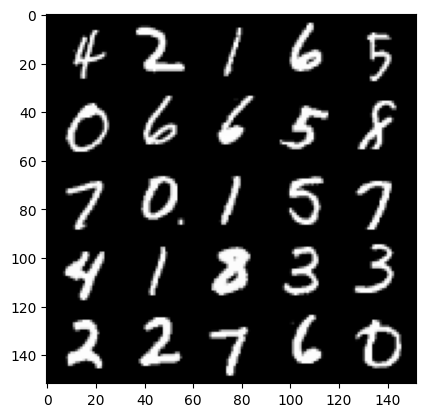

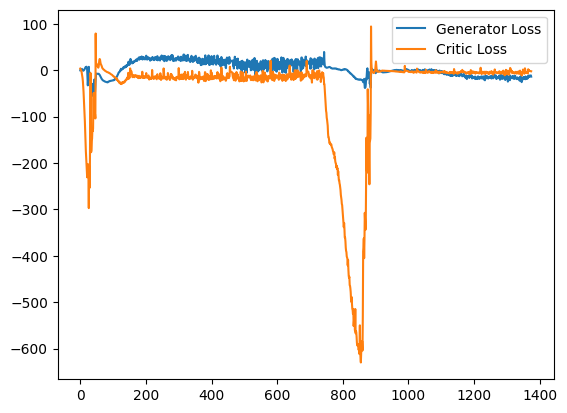

 70%|██████▉   | 328/469 [00:18<00:07, 18.09it/s]

Epoch 59, step 28000: Generator loss: -15.722066315159202, critic loss: -2.219794510281084


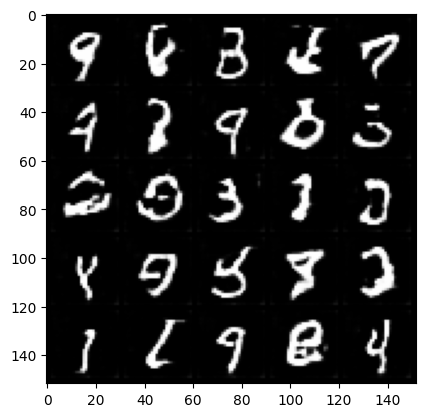

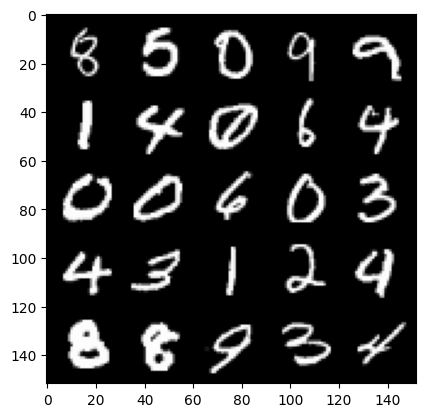

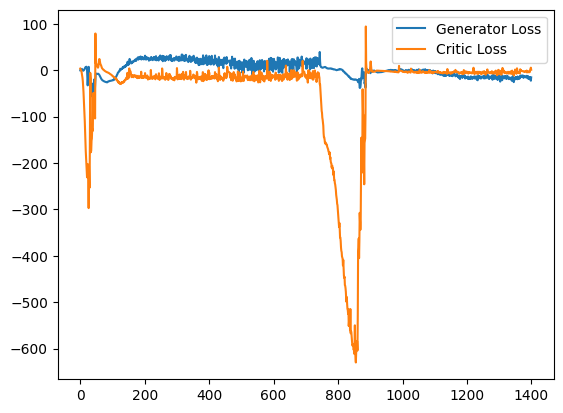

 77%|███████▋  | 360/469 [00:19<00:05, 18.24it/s]

Epoch 60, step 28500: Generator loss: -19.14906819242239, critic loss: -4.482586329150199


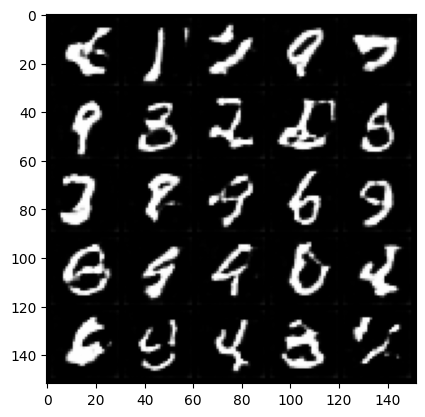

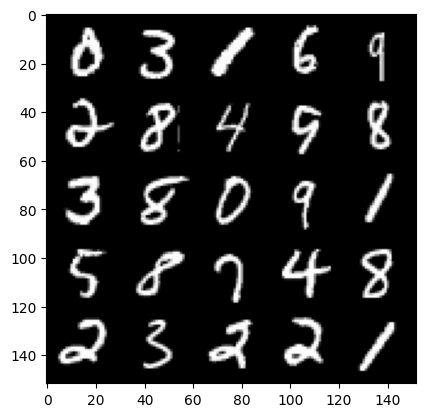

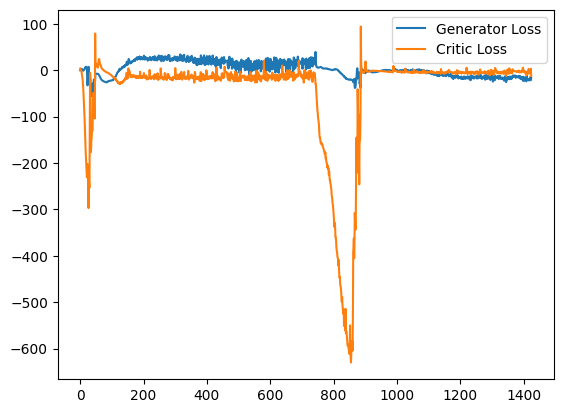

 83%|████████▎ | 390/469 [00:21<00:04, 17.90it/s]

Epoch 61, step 29000: Generator loss: -20.94054877924919, critic loss: -3.9748648226559173


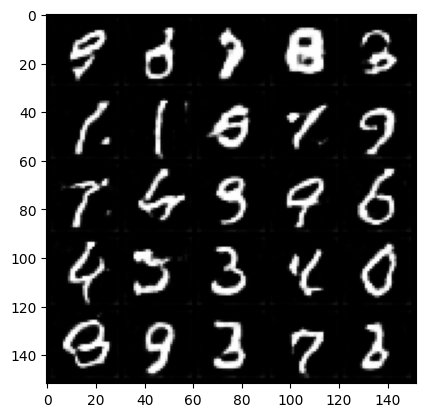

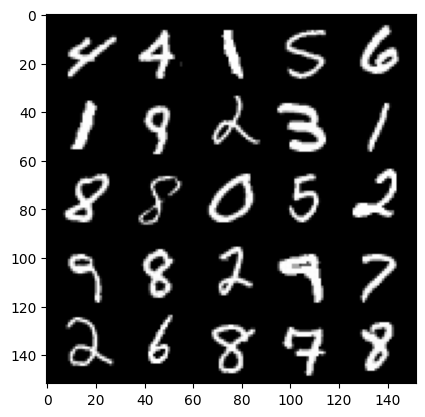

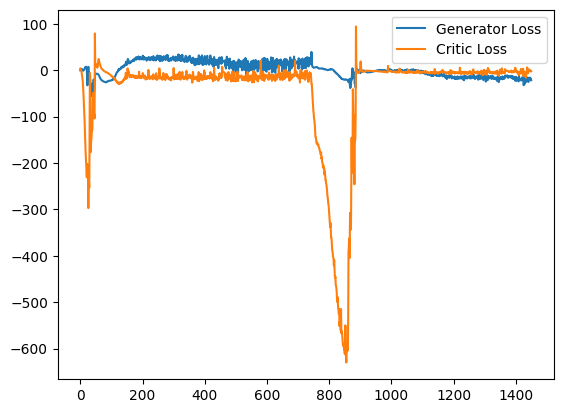

 90%|████████▉ | 422/469 [00:23<00:02, 17.95it/s]

Epoch 62, step 29500: Generator loss: -23.863792449951173, critic loss: -3.1538558258771894


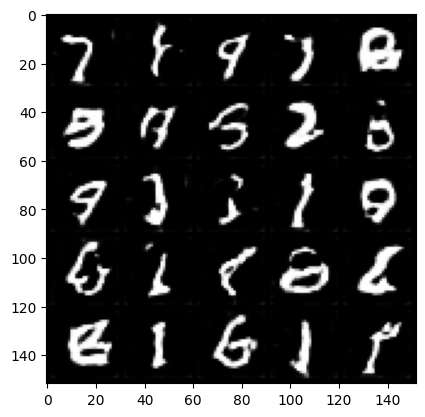

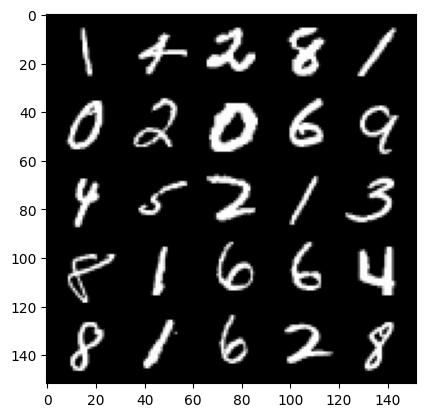

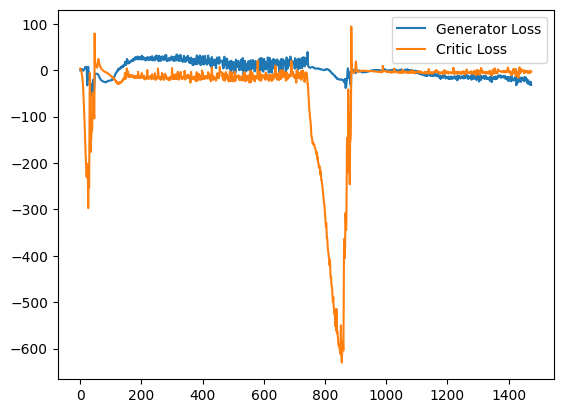

 96%|█████████▋| 452/469 [00:25<00:00, 17.76it/s]

Epoch 63, step 30000: Generator loss: -33.15667271804809, critic loss: -4.004623378133775


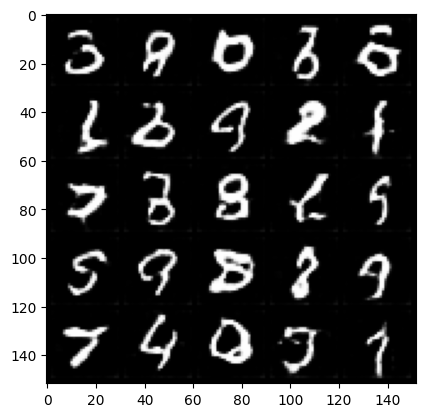

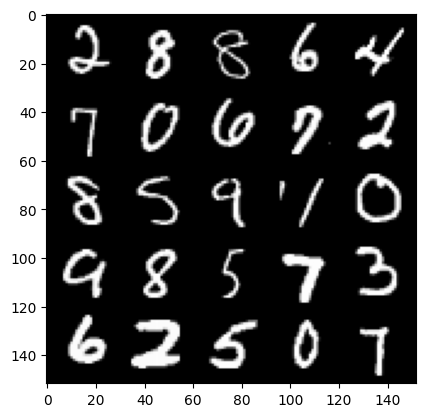

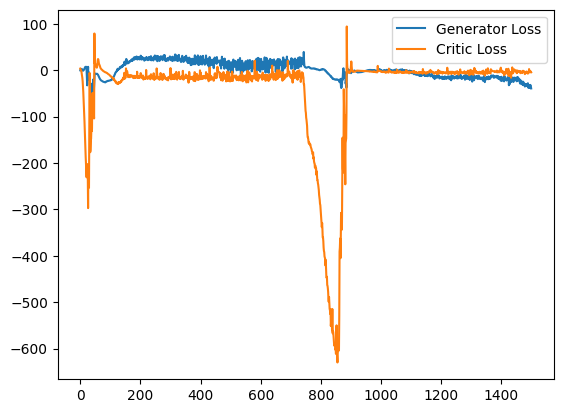

  3%|▎         | 14/469 [00:00<00:26, 17.28it/s]

Epoch 65, step 30500: Generator loss: -36.02943536376953, critic loss: -4.654057356739047


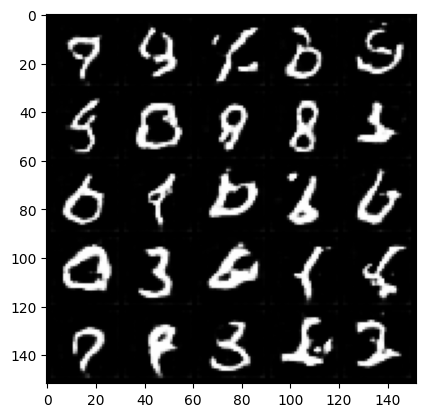

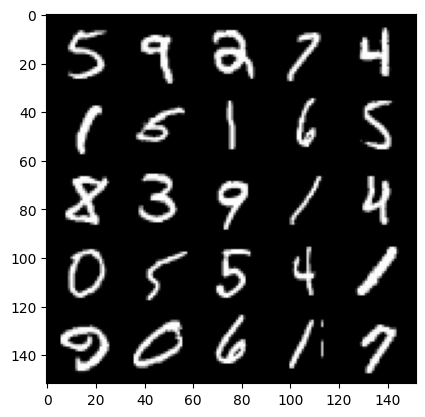

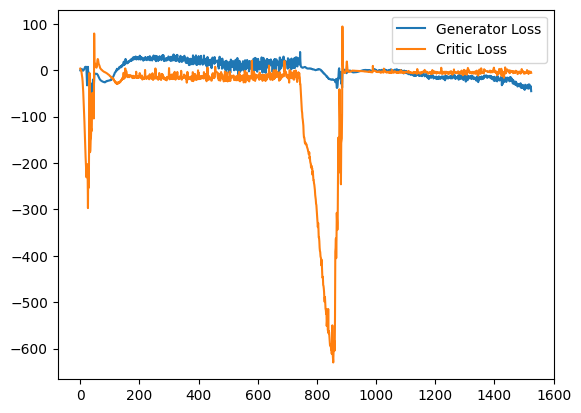

 10%|▉         | 46/469 [00:02<00:23, 18.03it/s]

Epoch 66, step 31000: Generator loss: -37.23568844223023, critic loss: -3.768365545010564


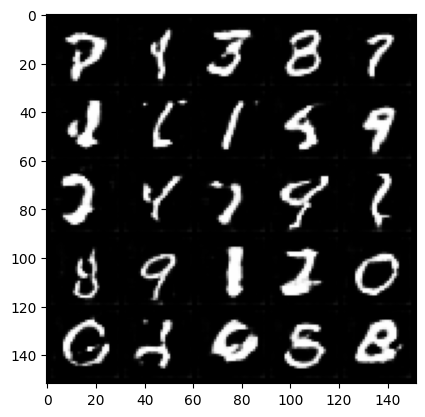

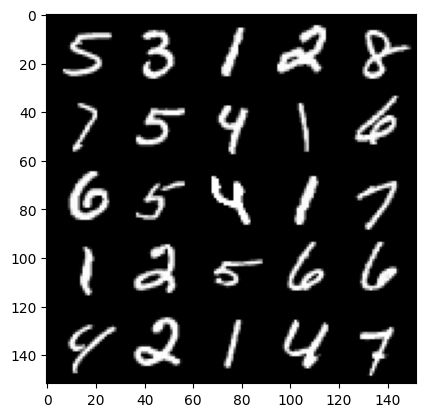

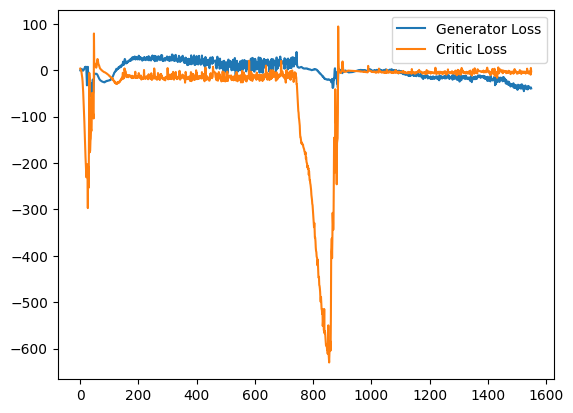

 16%|█▌        | 76/469 [00:04<00:21, 18.36it/s]

Epoch 67, step 31500: Generator loss: -38.457561305999754, critic loss: -4.161125356376172


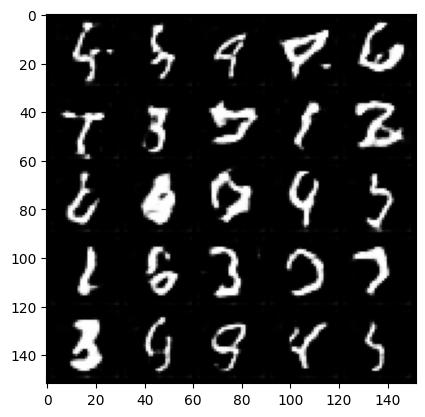

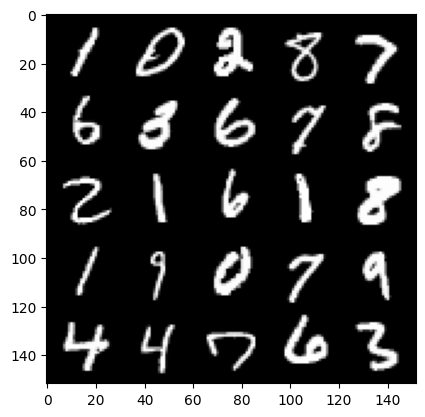

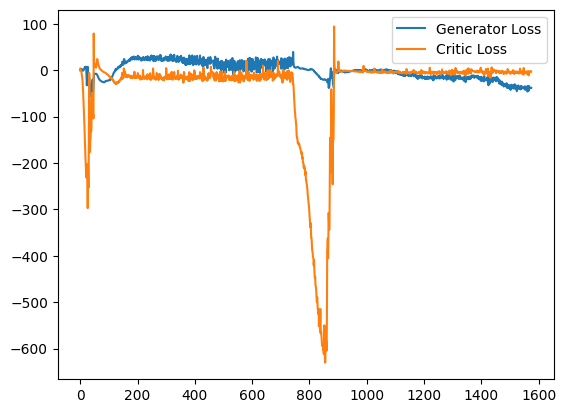

 23%|██▎       | 108/469 [00:05<00:19, 18.11it/s]

Epoch 68, step 32000: Generator loss: -39.147566497802735, critic loss: -3.896424456334111


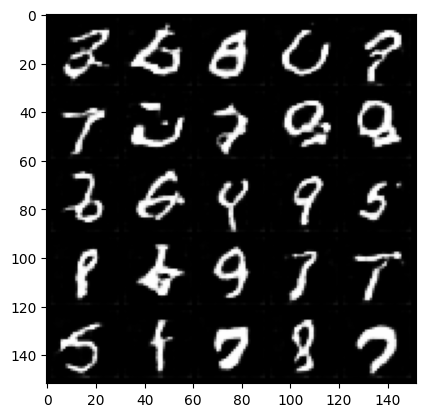

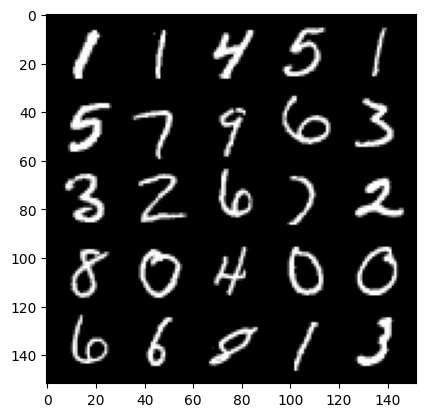

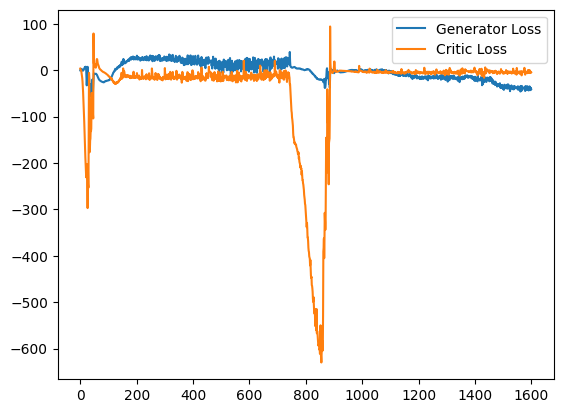

 29%|██▉       | 138/469 [00:07<00:18, 17.99it/s]

Epoch 69, step 32500: Generator loss: -37.81844046211243, critic loss: -3.43686639250517


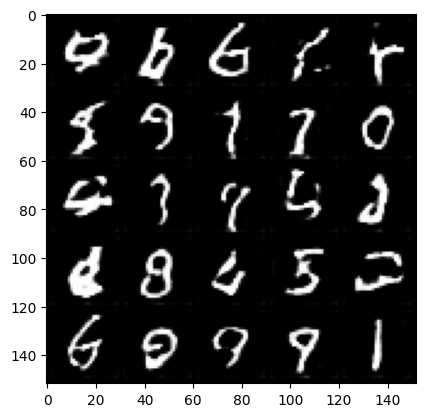

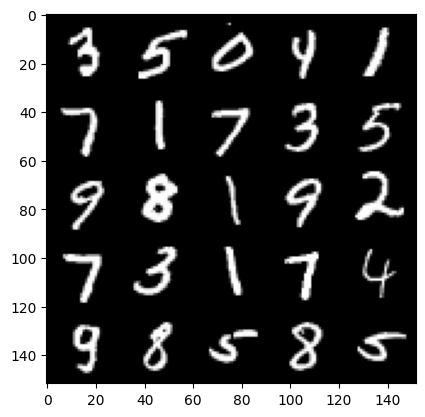

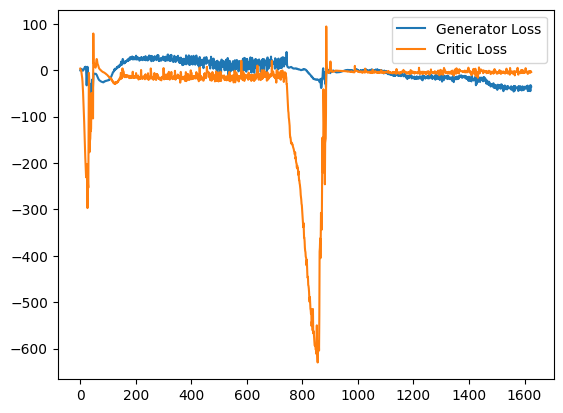

 36%|███▌      | 170/469 [00:09<00:16, 17.99it/s]

Epoch 70, step 33000: Generator loss: -32.96067041778564, critic loss: -4.490481719434264


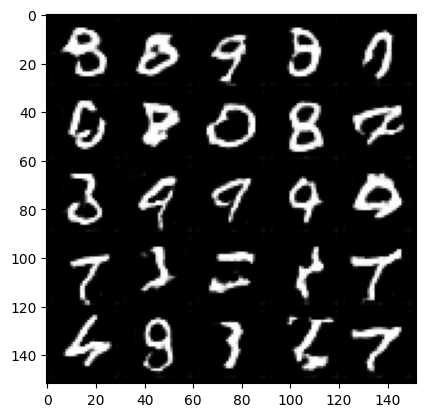

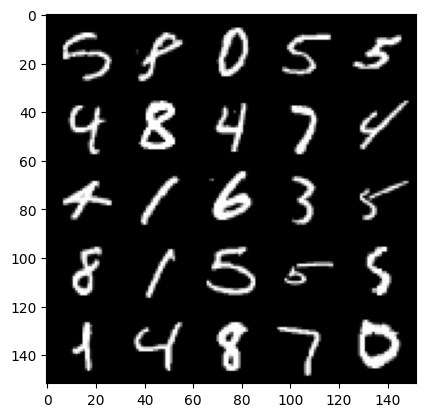

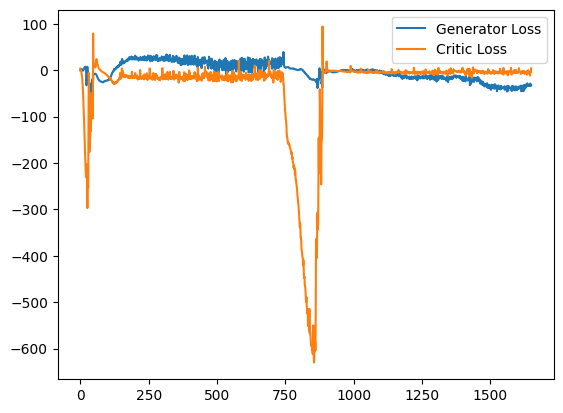

 43%|████▎     | 200/469 [00:11<00:15, 17.25it/s]

Epoch 71, step 33500: Generator loss: -33.91305770301819, critic loss: -5.231834394919868


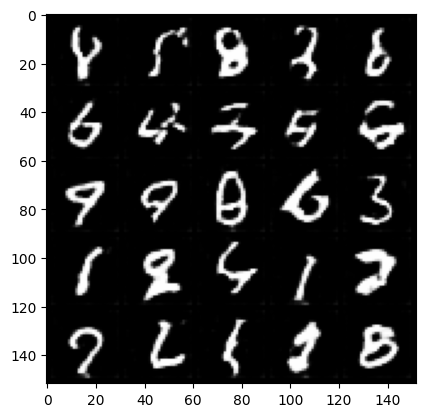

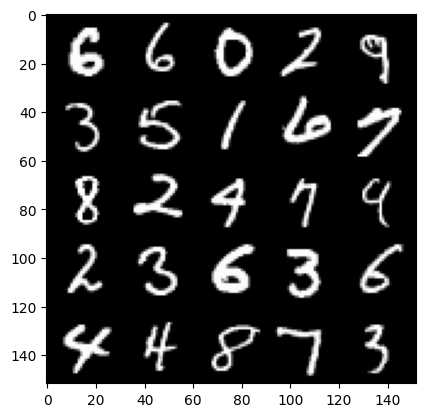

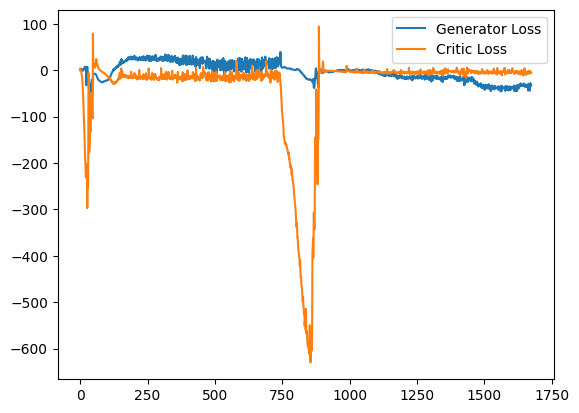

 49%|████▉     | 232/469 [00:12<00:13, 17.88it/s]

Epoch 72, step 34000: Generator loss: -30.361563049435617, critic loss: -4.41335149677992


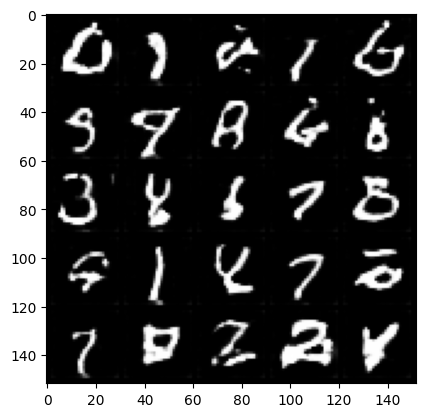

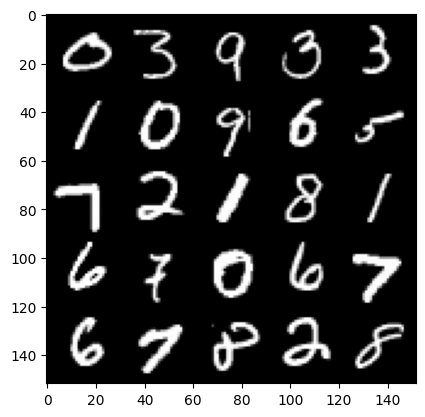

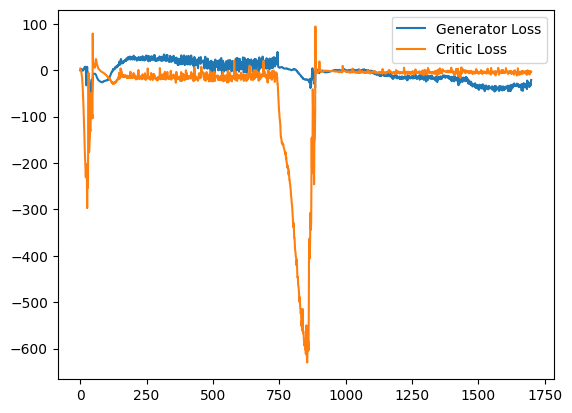

 56%|█████▌    | 262/469 [00:14<00:11, 18.02it/s]

Epoch 73, step 34500: Generator loss: -26.571165275931357, critic loss: -3.1135995412111273


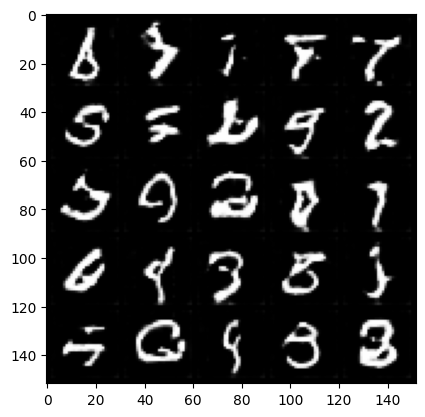

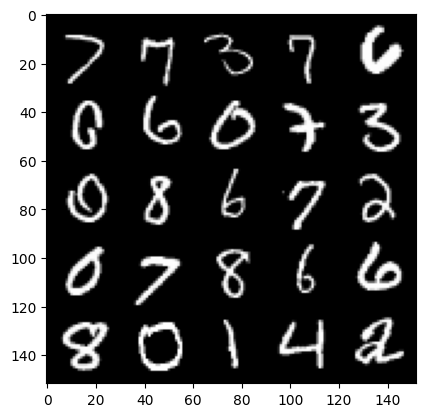

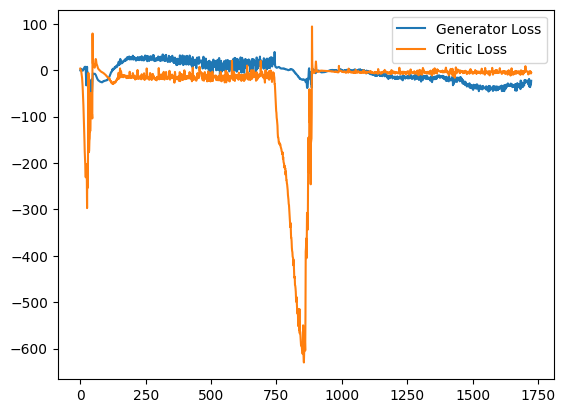

 63%|██████▎   | 294/469 [00:16<00:09, 18.03it/s]

Epoch 74, step 35000: Generator loss: -25.972548421144484, critic loss: -6.214304621875281


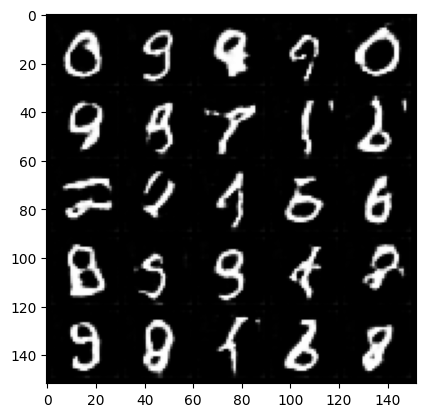

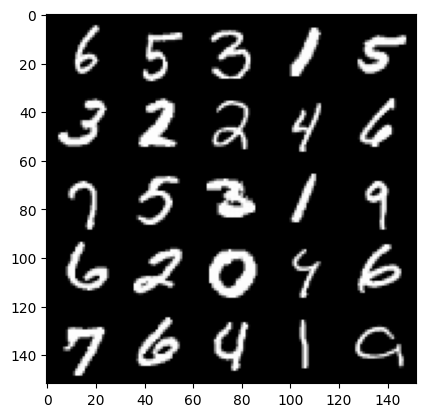

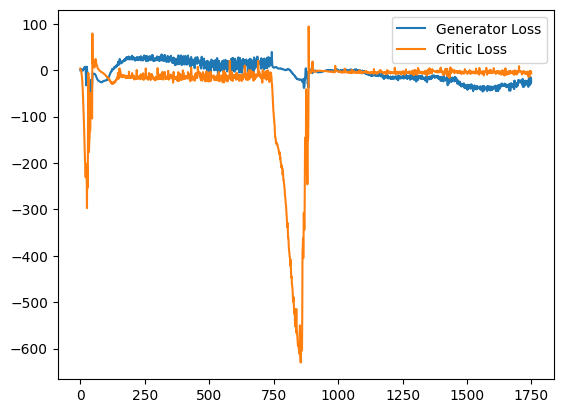

 69%|██████▉   | 324/469 [00:18<00:08, 17.93it/s]

Epoch 75, step 35500: Generator loss: -23.565352919280528, critic loss: -6.353911910700796


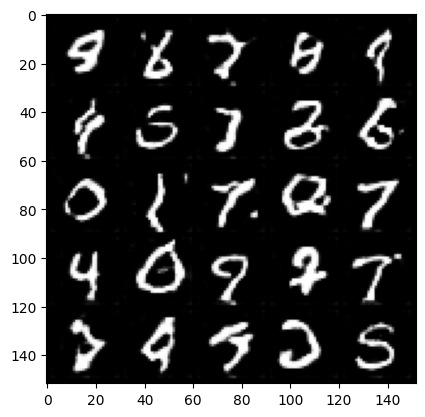

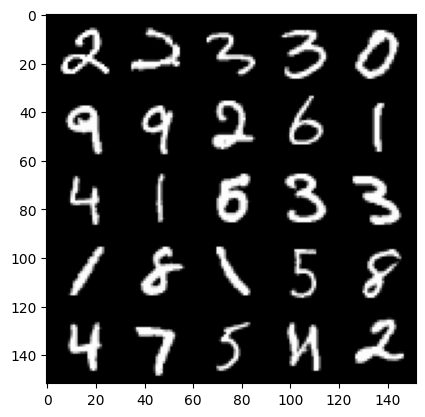

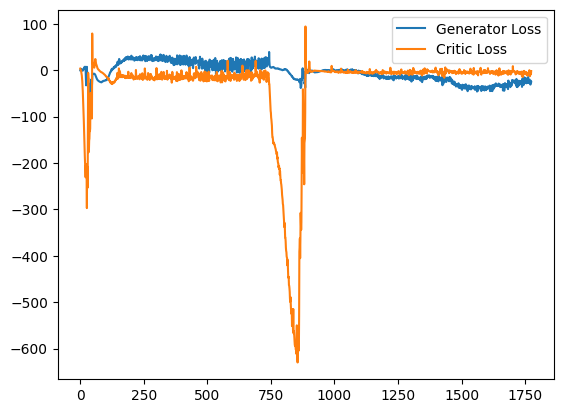

 76%|███████▌  | 356/469 [00:19<00:06, 18.19it/s]

Epoch 76, step 36000: Generator loss: -25.71741042137146, critic loss: -4.736471357846264


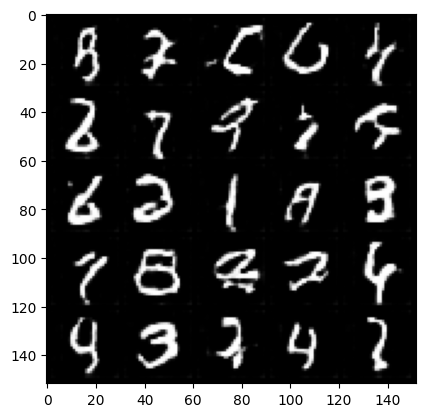

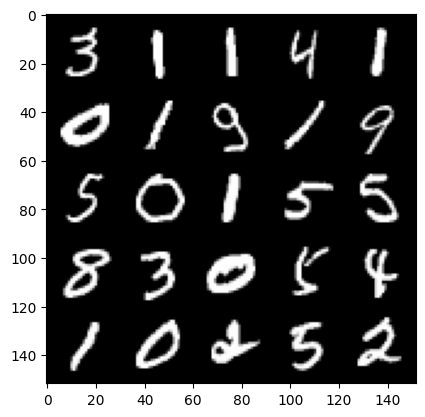

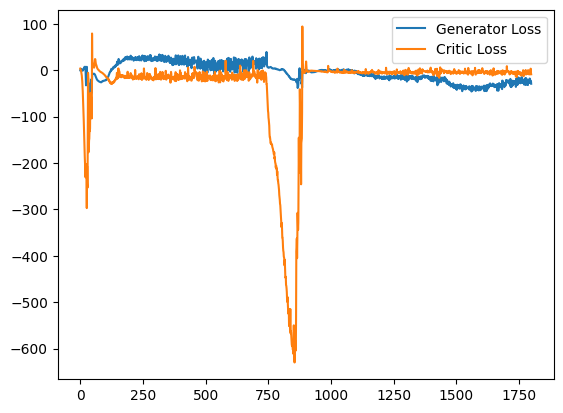

 82%|████████▏ | 386/469 [00:21<00:04, 17.95it/s]

Epoch 77, step 36500: Generator loss: -24.48172526359558, critic loss: -3.522522257733344


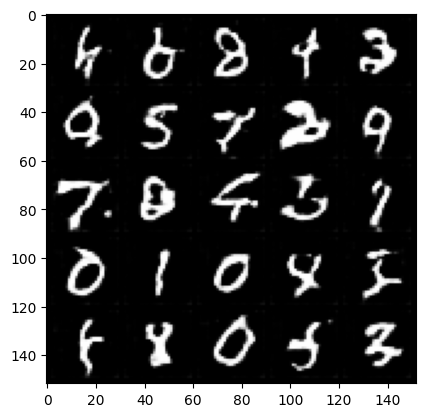

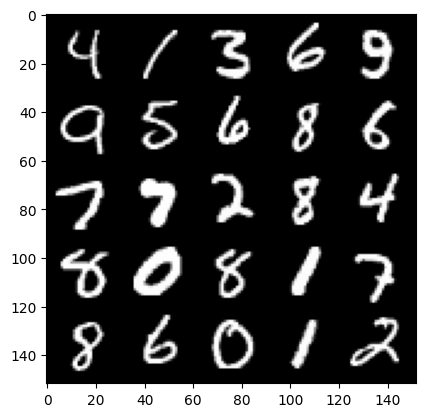

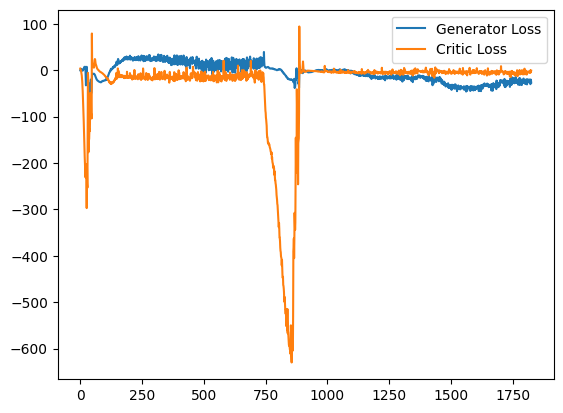

 89%|████████▉ | 418/469 [00:23<00:02, 18.03it/s]

Epoch 78, step 37000: Generator loss: -20.78337681722641, critic loss: -4.654136674267055


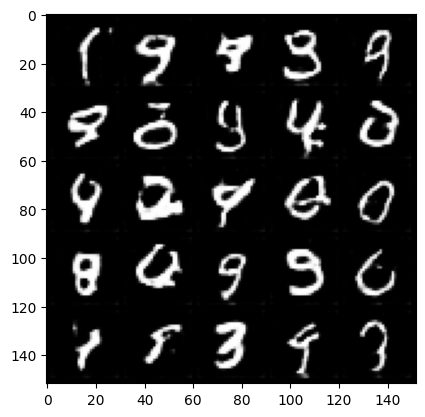

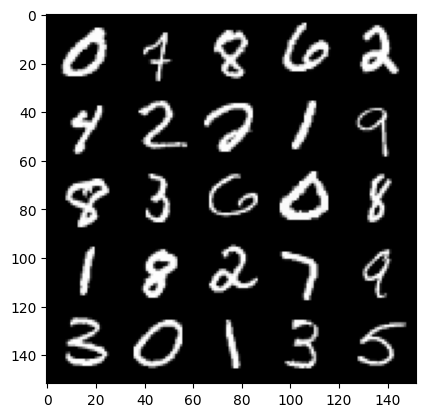

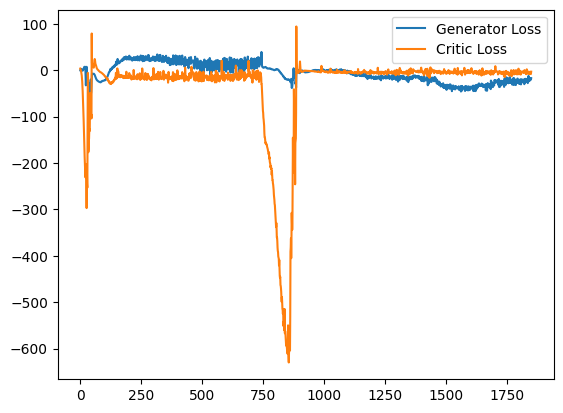

 96%|█████████▌| 449/469 [00:25<00:01, 18.07it/s]

Epoch 79, step 37500: Generator loss: -18.87962405103445, critic loss: -6.240999544858929


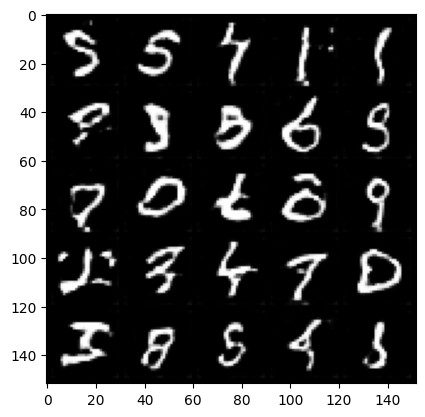

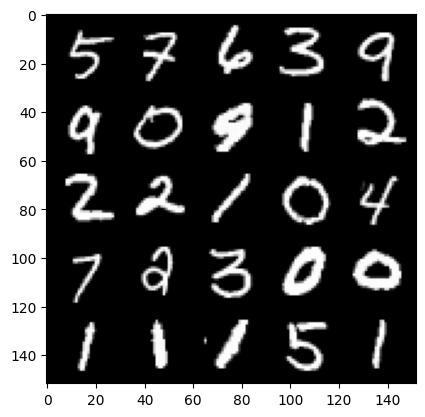

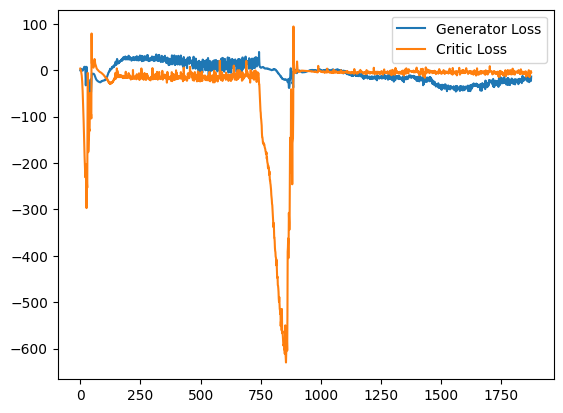

  2%|▏         | 10/469 [00:00<00:25, 18.00it/s]

Epoch 81, step 38000: Generator loss: -14.656721044301987, critic loss: -6.065447650706769


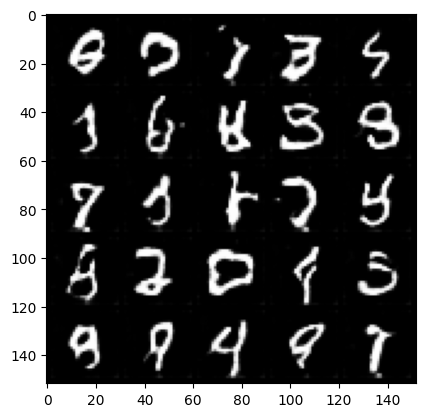

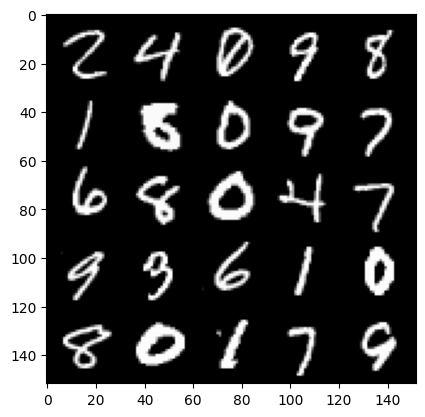

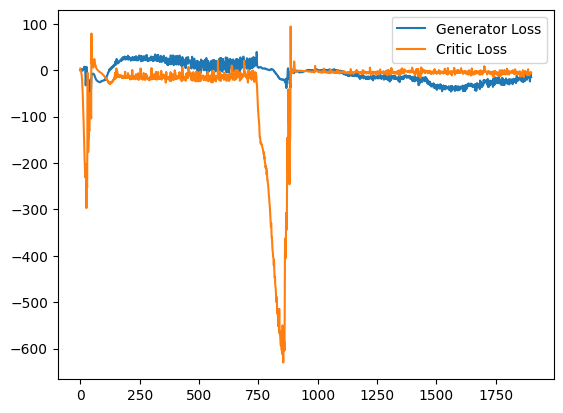

  9%|▉         | 42/469 [00:02<00:23, 18.14it/s]

Epoch 82, step 38500: Generator loss: -12.835487006992102, critic loss: -7.079049788904197


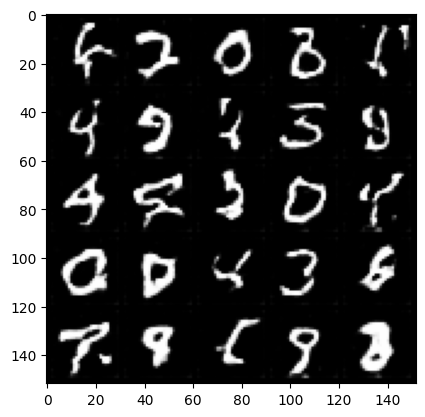

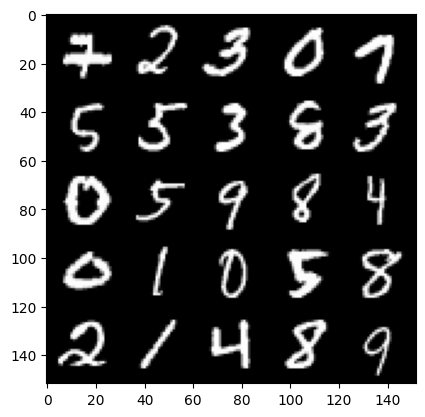

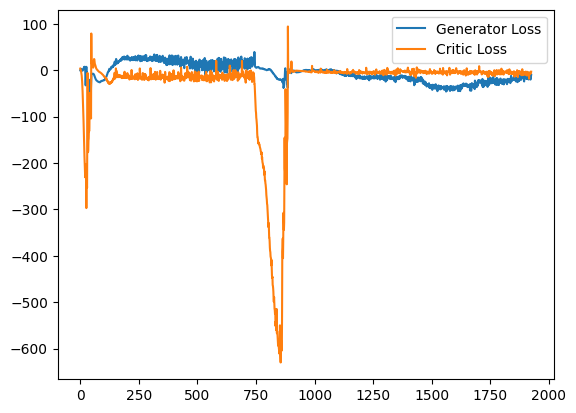

 15%|█▌        | 72/469 [00:04<00:22, 17.42it/s]

Epoch 83, step 39000: Generator loss: -11.222342317342758, critic loss: -6.1820390553355224


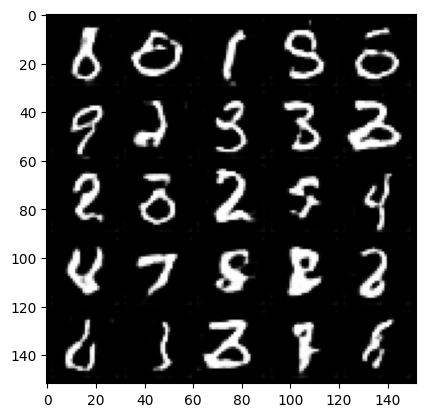

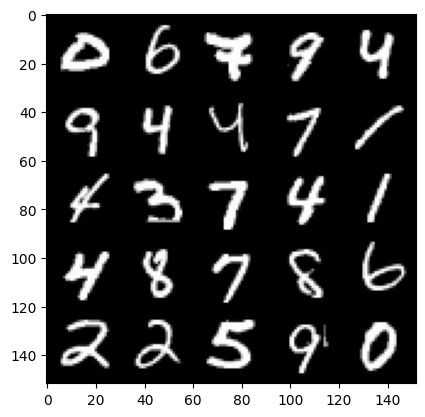

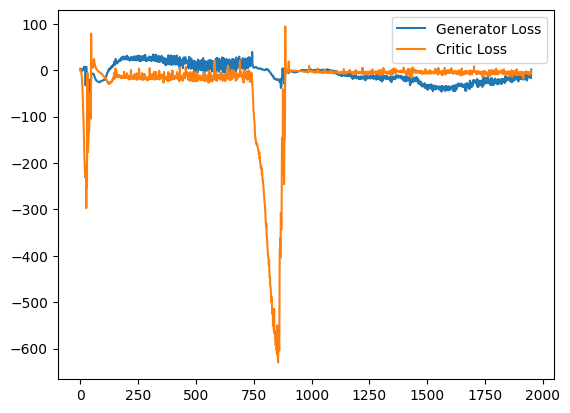

 22%|██▏       | 104/469 [00:05<00:19, 18.26it/s]

Epoch 84, step 39500: Generator loss: -12.227308876395226, critic loss: -5.979498287487029


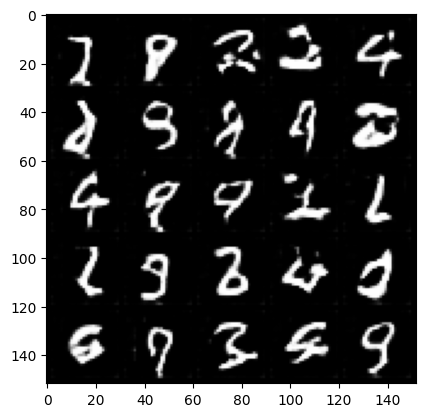

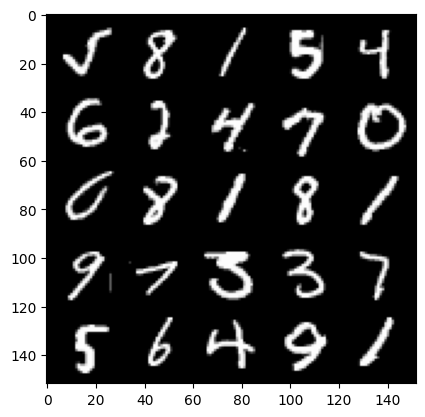

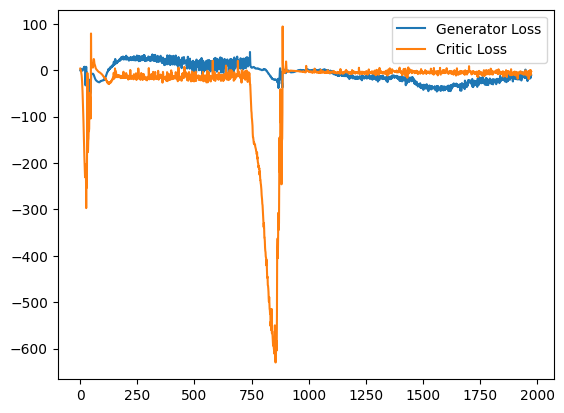

 29%|██▉       | 135/469 [00:07<00:18, 18.26it/s]

Epoch 85, step 40000: Generator loss: -11.39706669652462, critic loss: -3.4285329728245757


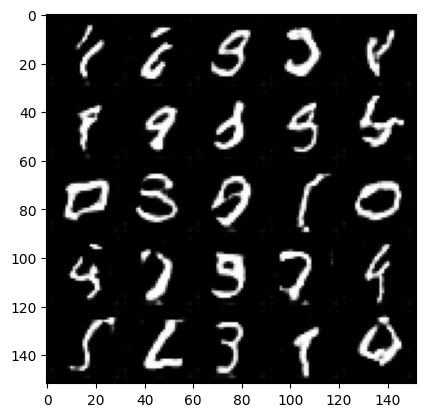

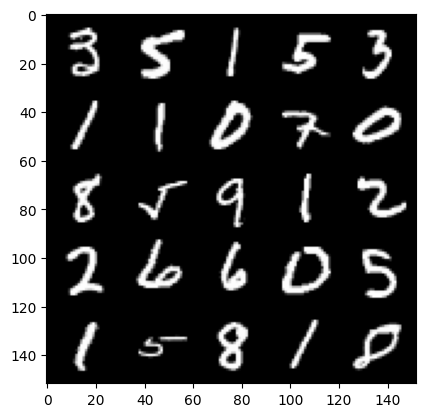

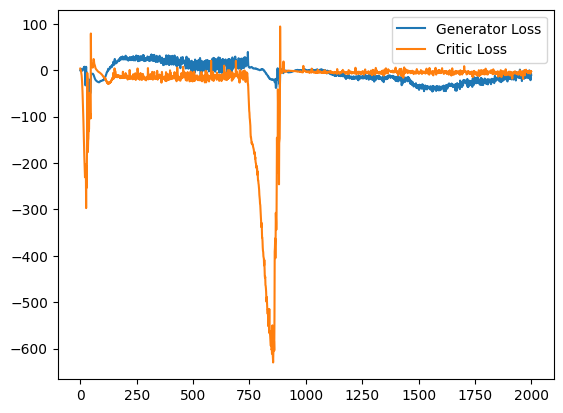

 35%|███▌      | 166/469 [00:09<00:17, 17.65it/s]

Epoch 86, step 40500: Generator loss: -7.958913409292698, critic loss: -6.466712855440383


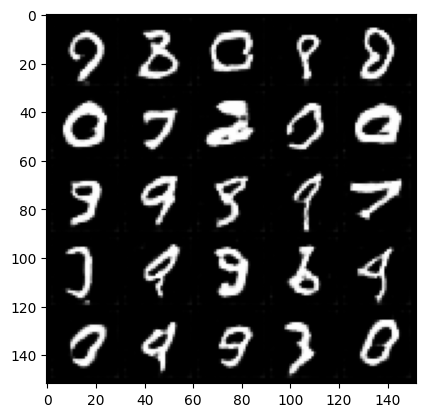

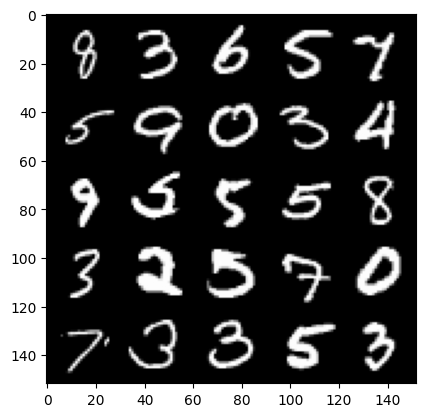

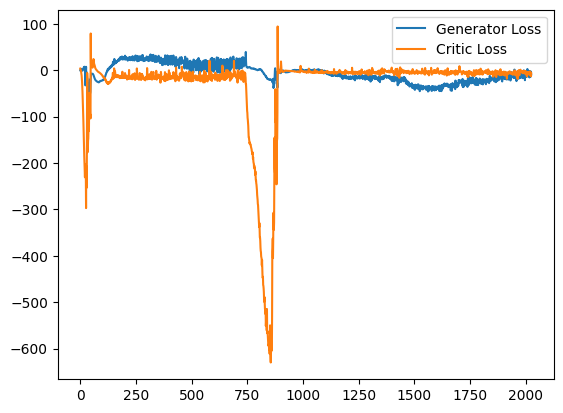

 42%|████▏     | 196/469 [00:11<00:15, 17.72it/s]

Epoch 87, step 41000: Generator loss: -10.465610979020596, critic loss: -6.638347338294986


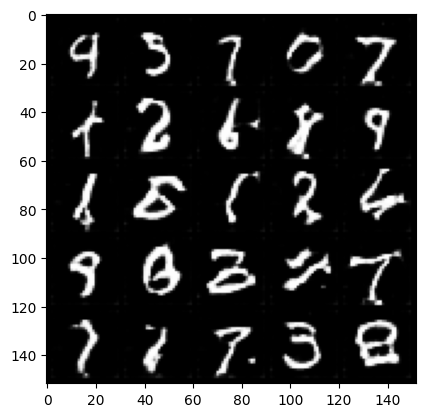

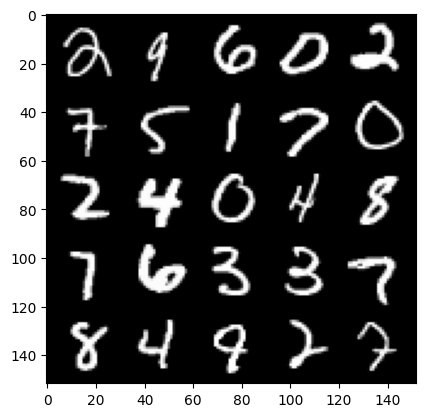

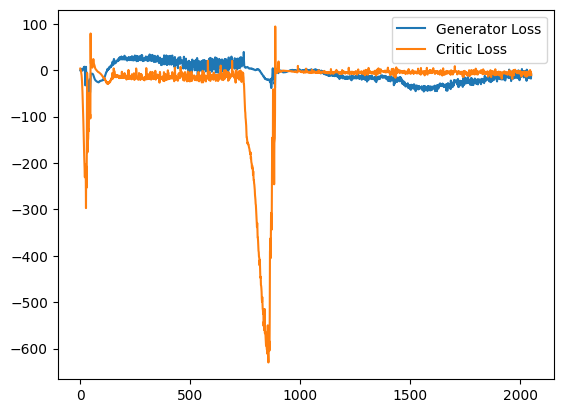

 48%|████▊     | 227/469 [00:12<00:13, 17.90it/s]

Epoch 88, step 41500: Generator loss: -12.976251388669015, critic loss: -7.830934228551389


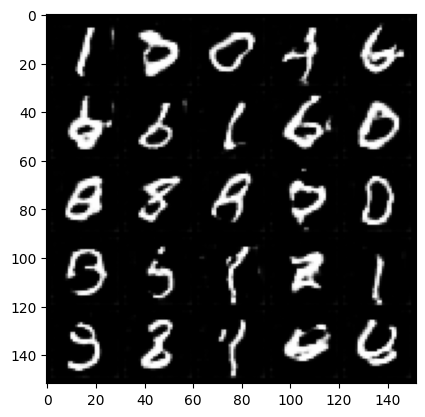

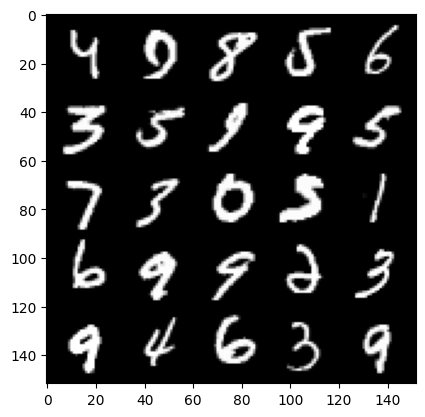

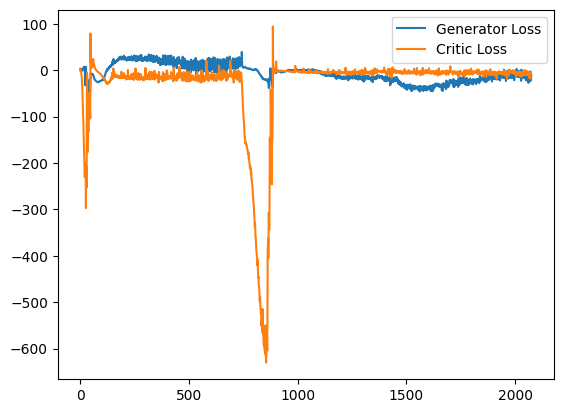

 55%|█████▌    | 258/469 [00:14<00:11, 18.33it/s]

Epoch 89, step 42000: Generator loss: -8.64431501045823, critic loss: -8.250708094394204


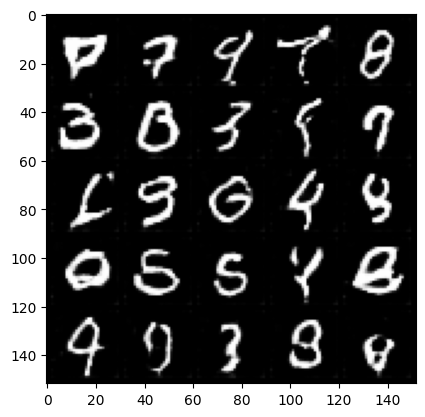

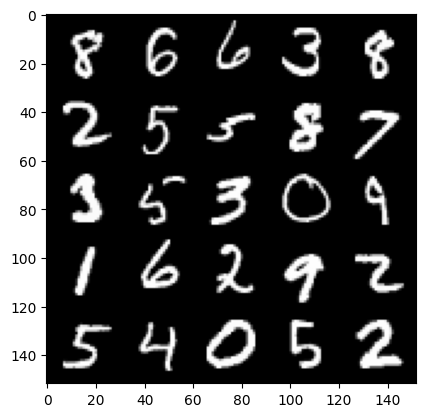

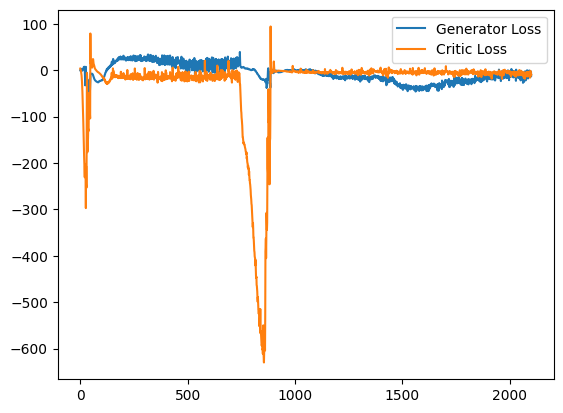

 62%|██████▏   | 290/469 [00:16<00:09, 18.37it/s]

Epoch 90, step 42500: Generator loss: -3.183033845603466, critic loss: -6.743053371548655


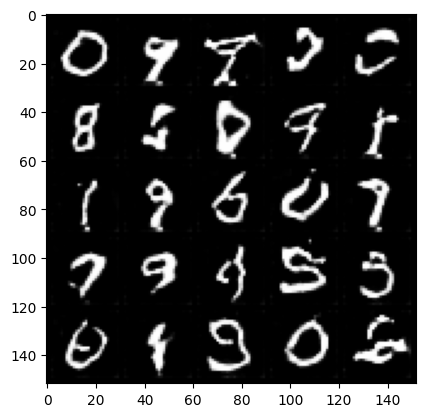

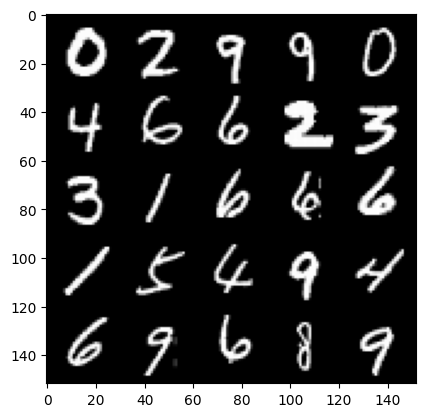

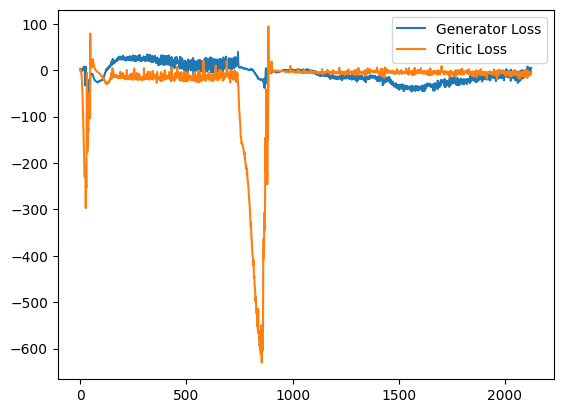

 68%|██████▊   | 320/469 [00:17<00:08, 18.10it/s]

Epoch 91, step 43000: Generator loss: 1.6701580490618944, critic loss: -6.989308954626321


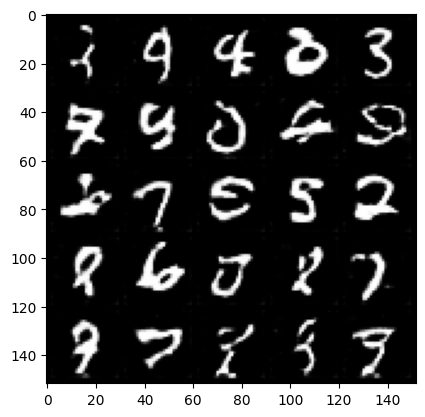

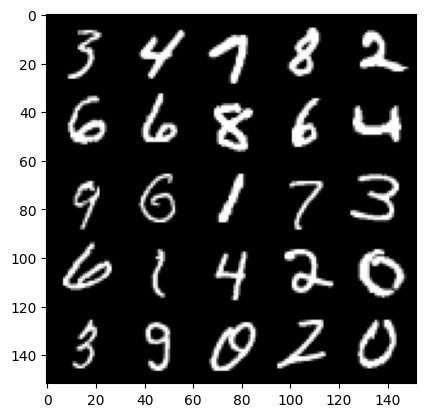

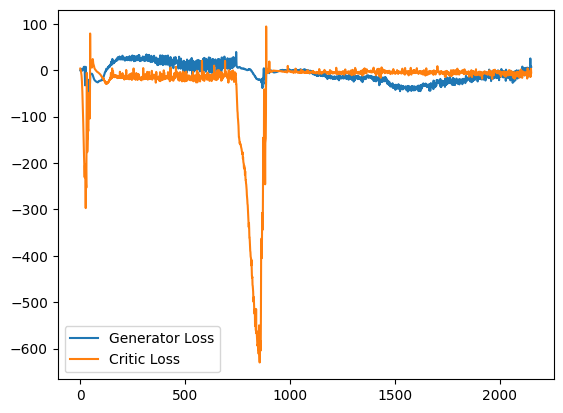

 75%|███████▌  | 352/469 [00:20<00:06, 17.90it/s]

Epoch 92, step 43500: Generator loss: 6.245402102127671, critic loss: -5.91110921827256


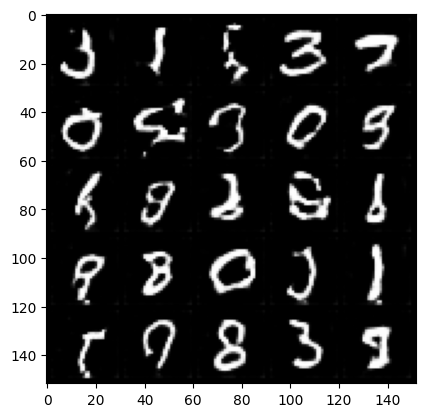

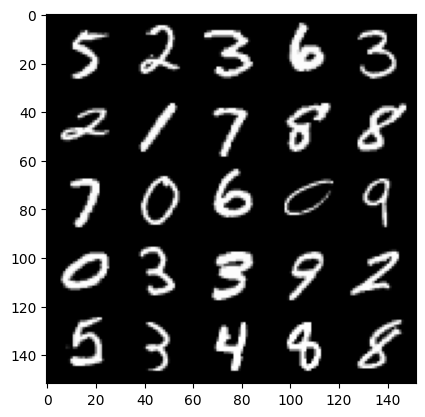

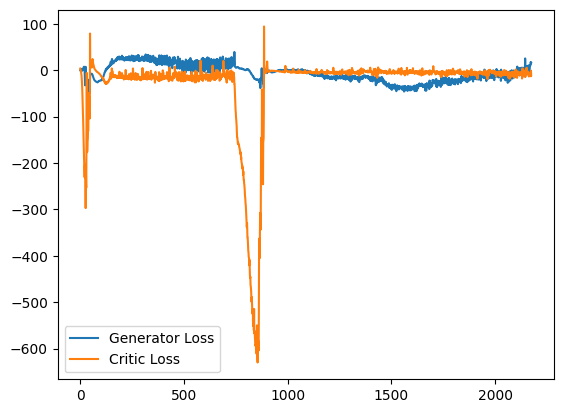

 81%|████████▏ | 382/469 [00:21<00:04, 18.15it/s]

Epoch 93, step 44000: Generator loss: 13.136385547995568, critic loss: -8.063705449217561


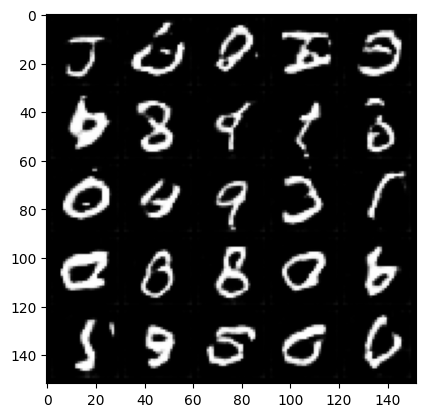

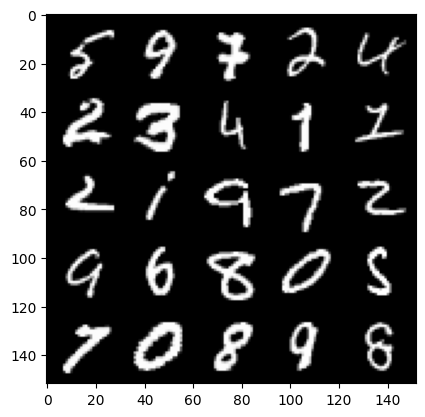

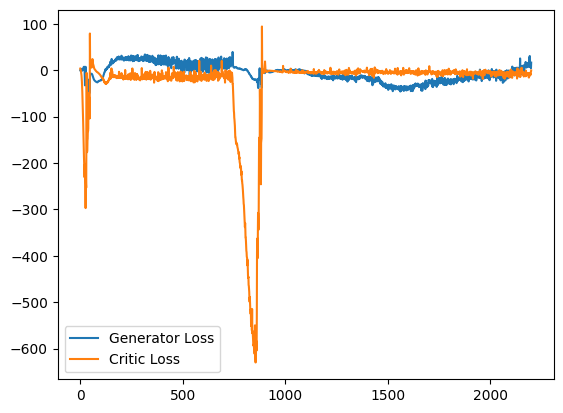

 88%|████████▊ | 413/469 [00:22<00:03, 18.27it/s]

Epoch 94, step 44500: Generator loss: 20.1531181627363, critic loss: -0.4216294919609998


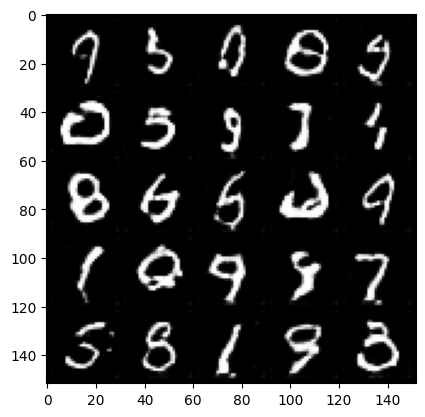

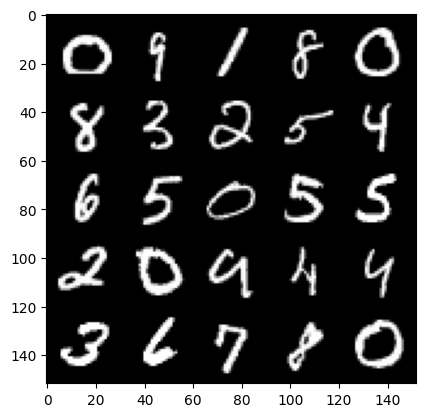

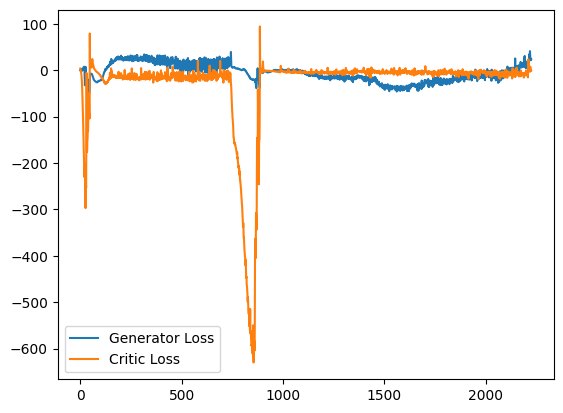

 95%|█████████▍| 444/469 [00:24<00:01, 18.15it/s]

Epoch 95, step 45000: Generator loss: 22.1022151055336, critic loss: -2.591618061065676


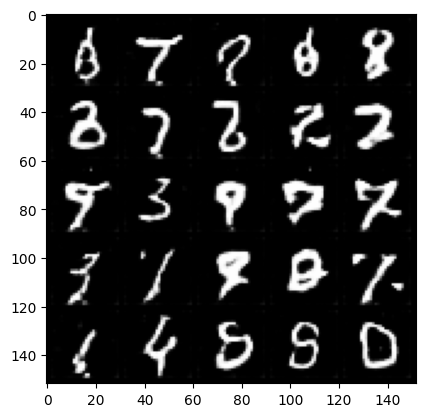

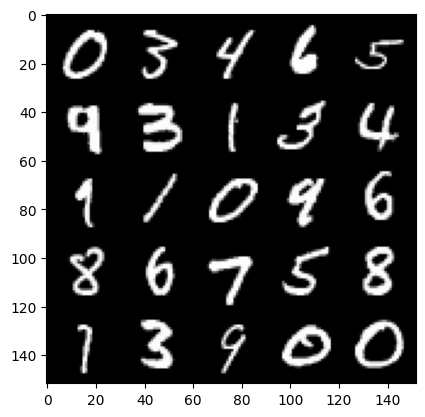

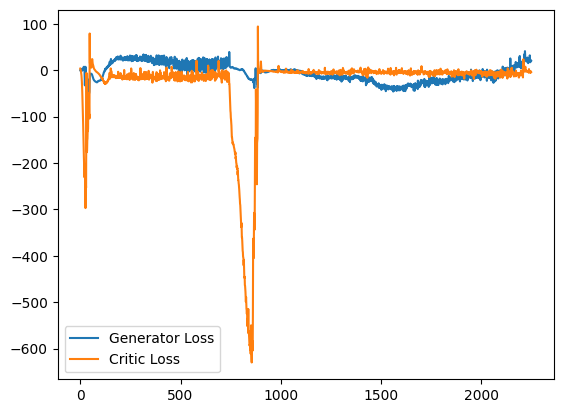

  1%|▏         | 6/469 [00:00<00:25, 18.04it/s]

Epoch 97, step 45500: Generator loss: 20.494119265556336, critic loss: -3.185772322535515


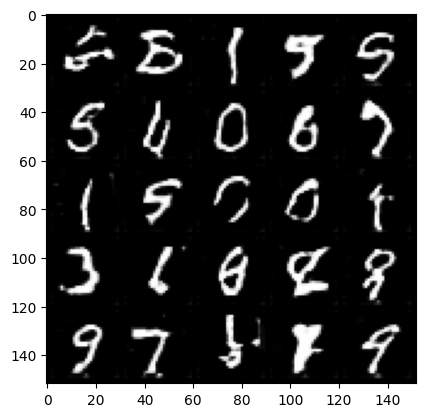

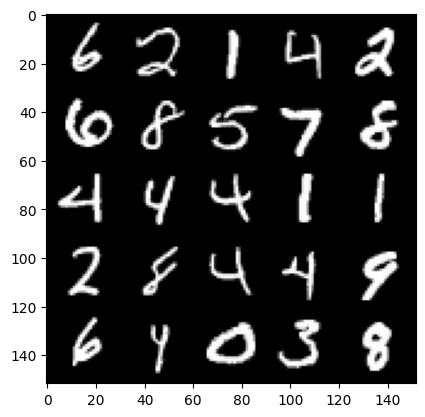

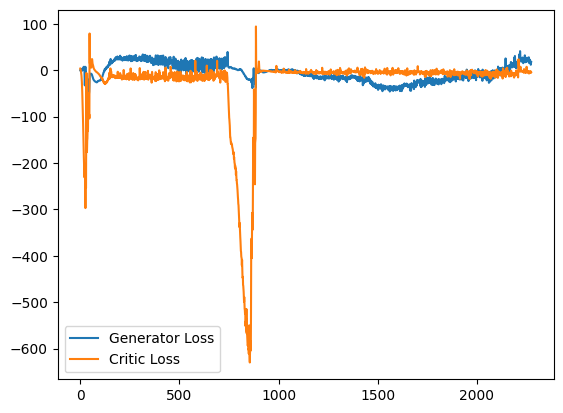

  8%|▊         | 38/469 [00:02<00:24, 17.94it/s]

Epoch 98, step 46000: Generator loss: 17.899390142321586, critic loss: -4.489450749027726


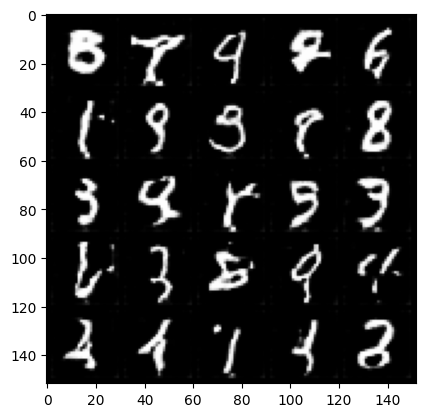

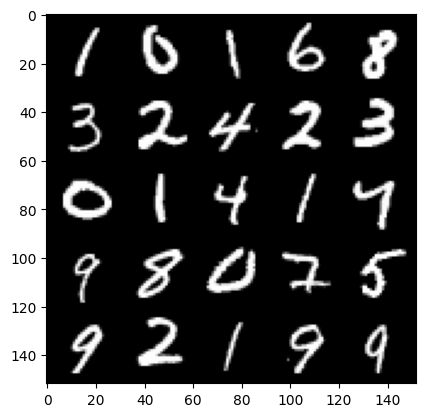

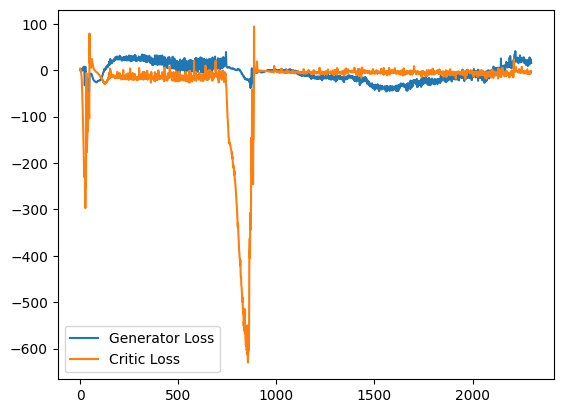

 14%|█▍        | 68/469 [00:03<00:21, 18.25it/s]

Epoch 99, step 46500: Generator loss: 13.528570009738207, critic loss: -2.7021882253646825


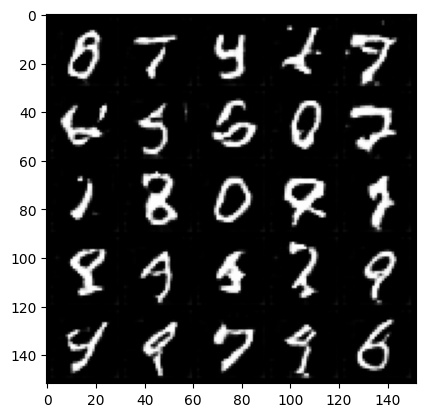

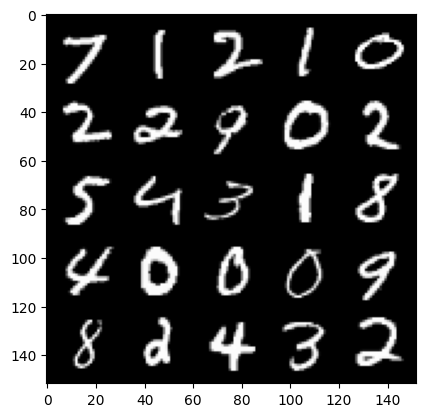

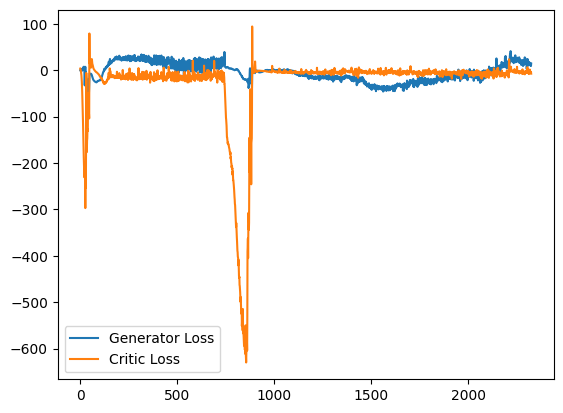

100%|██████████| 469/469 [00:26<00:00, 17.90it/s]


In [14]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
